## **[Machine-Learned Emulator Workflow for Teleconnection Discovery and Uncertainty Quantification](https://www.mdpi.com/2073-4441/18/1/79)**

### **Required Dependencies**

In [1]:

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import time, pickle, json, joblib
from joblib import parallel_backend
import numpy as np
import random
import seaborn as sns
import math

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import (
                                classification_report,
                                confusion_matrix,
                                precision_score,
                                recall_score,
                                f1_score,
                                ConfusionMatrixDisplay,
                                r2_score,
                                mean_absolute_error,
                                median_absolute_error,
                                explained_variance_score,
                            )
from sklearn.inspection import PartialDependenceDisplay, partial_dependence


try:
    from sklearn.metrics import root_mean_squared_error
    def RMSE(y_true, y_pred):
        return root_mean_squared_error(y_true, y_pred)
except Exception:
    from sklearn.metrics import mean_squared_error
    def RMSE(y_true, y_pred):
        return mean_squared_error(y_true, y_pred, squared=False)

from lightgbm import LGBMClassifier, LGBMRegressor, early_stopping, log_evaluation
import xgboost as xgb

from IPython.display import Image, display

root_path = Path.cwd()


### **0.  Welcome and Roadmap**

In this notebook, we walk through a complete **machine-learned emulator workflow** for a simulation-based environmental system. The goal is not only to train predictive models, but to understand how trained emulators can help us explore system behavior, identify important drivers, and interpret possible teleconnection-like patterns in a scientifically way.

The workflow we follow is:

1. **Problem Formulation**
    - Understand why emulators are useful for expensive environmental simulations.
2. **Dataset Inspection**
    - Explore the input drivers, output targets, and target distributions.
3. **Model Families**
    - Introduce Random Forest, LightGBM, and XGBoost as emulator models.
4. **Training Emulator Models**
    - Fitting the models on training datasets
5. **Evaluation Emulator Models**
    - Save and load model weights, and evaluate predictive performance.
6. **Feature Importance**
    - Identify which variables the emulator uses the most.
7. **Partial Dependence Plots**
    - Examine how model predictions change as important variables vary.
    - Bootstrap PDPs will also be used to asses whether PDP patterns are stable or uncertain.
8. **Workflow Transferability**
    - How to transfer the workflow to other projects.
9. **Key Takeaways**
    - Conclude the workshop

#### **0.1: Learning objectives**

By the end of this notebook, you should be able to:

- Explain the purpose of a machine-learned emulator in a simulation-based environmental setting,
- Describe why tree-based tabular models such as **Random Forest**, **LightGBM**, and **XGBoost** are useful for this problem,
- Understand how pre-trained emulator models are loaded and evaluated,
- Interpret feature importance as a measure of **predictive relevance** rather than causality,
- Understand the logic of **PDPs**, explain what PDPs reveal and why bootstrapped PDPs are useful,
- Identify the **strength/limitations** of emulator-based analysis and interpretation.
  

# 1. **Problem Formulation and Why Emulators Are Needed**
- Environmental systems are controlled by many interacting drivers:
  - Climate Conditions  
  - Hydrology  
  - Land Use  
  - Nutrient Loading  
  - Management and Policy Scenarios  
- Process-based CHANS models are useful because they simulate these coupled human-natural interactions.
- These simulations help us understand:
  - Which drivers influence water quality outcomes?
  - How do environmental and policy scenarios affect chlorophyll-a?
  - Are there distant or indirect drivers linked to local outcomes?
## **Main Challenge**
- Detailed CHANS simulations can be computationally expensive.
- This makes it difficult to repeatedly:
  - explore many scenarios,
  - compare driver sensitivities,
  - test policy interventions,
  - generate interpretation plots,
  - run uncertainty or stability analysis.
## **Emulator-Based Solution**
- A machine-learned emulator is a fast surrogate model.
- It is trained to approximate the outputs of a more complex simulator.
- The emulator does **not** replace the simulator.
- Instead, it helps analyze simulator behavior more efficiently.
## **What the Emulator Learns in This Workshop**
- **Inputs:**
  - Environmental Drivers,
  - Hydrological Variables,
  - Climate Related Variables,
  - Nutrient related Variables,
  - Policy/Scenario Variables.
- **Outputs:**
  - Chlorophyll-a Surface Mean,
  - Trophic State Category.
## **Two Complementary Emulator Tasks**
- **Regression task**
  - Predicts continuous chlorophyll-a surface mean.
  - Analyze response magnitude.
- **Classification task**
  - Predicts trophic-state category.
  - Analyze ecological regime behavior.

### **2. Dataset Overview**

#### **2.1 What kind of data do we have?**

We will use simulator-derived tabular dataset constructed from a coupled human-natural system (CHANS) modeling framework. Each row represents one simulated data point while each column represents either an input driver or an output variable of interest.

The input variables comprise several groups of system drivers, including:

- **RCA outputs:** Describe nutrient-related fluxes and water-column variables,
- **RHESSys outputs:** Capture watershed-scale hydrologic and land-surface conditions,
- **derived hydrology variables:** Summarize river inflows and nutrient loading to Missisquoi Bay
- **GCM indicators:** Encode the climate model used in a scenario,
- **RCP scenario indicators:** Represent climate forcing pathways,
- **Phosphorus reduction scenario indicators:** Represent management or policy interventions,
and a small set of other inputs.


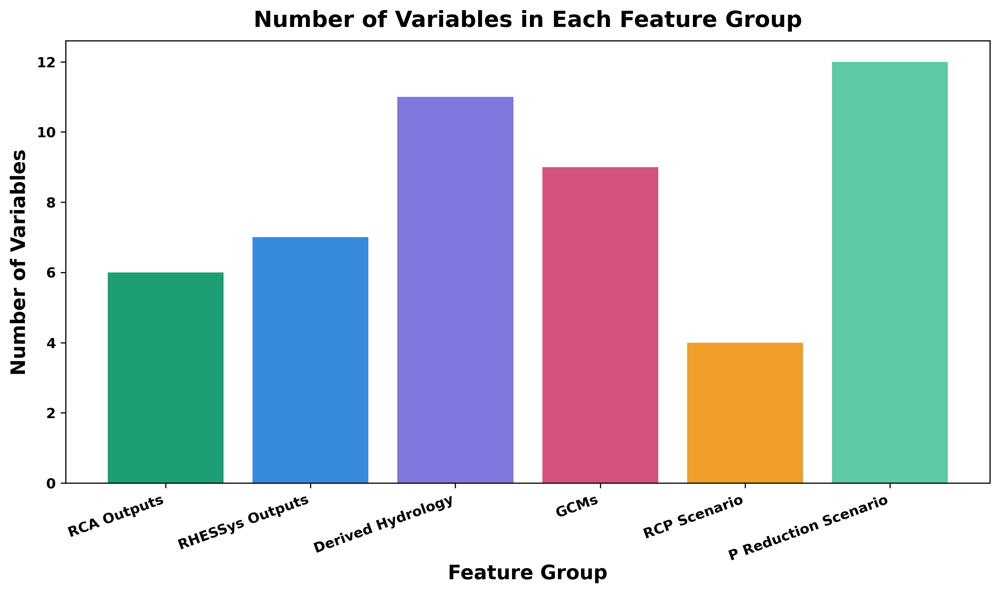

In [2]:

display(Image(filename="feature_group_counts_bar.png"))


#### **2.2 Inputs and outputs**

The dataset supports two related emulator tasks, each built from the same general set of input variables but with a different target variable.

- **Regression:** Target is CHLAVESurfaceMean, represents the `geographic average chlorophyll-a concentration in the surface layer of the bay.`
- **Classification:** Target is CHLAClass, represents `trophic-state categories derived from chlorophyll-a ranges.`
  
These two outputs are complementary: `the regression task captures continuous magnitude, while the classification task captures ecological regime.`


#### **2.3 Quick data inspection**

In [6]:

# Classification Data
csv_data_classification_train = pd.read_csv('./Workshop_Data/classification_train_workshop.csv')
csv_data_classification_test  = pd.read_csv('./Workshop_Data/classification_test_workshop.csv')

print("Classification Train Shape:", csv_data_classification_train.shape)
print("Classification Test Shape:",  csv_data_classification_test.shape)
display(csv_data_classification_train.head())


Classification Train Shape: (2000, 51)
Classification Test Shape: (400, 51)


,streamflow,JPO4,JPON,JPOP,PO4JRES,PO4T2R,POPR,baseflow,%sat_area,evap,...,20_redux,40_redux,60_redux,64_redux,80_redux,S0_redux,S1_redux,S2_redux,S3_redux,S4_redux
0,38.841812,2.755529,11.519166,2.141391,0.0,178711.034885,0.132428,1.157670,1.332656,2.867056,...,1,0,0,0,0,0,0,0,0,0
1,71.378652,1.050870,7.464491,0.786481,0.0,54997.987504,0.102740,2.095945,1.533031,1.066548,...,0,0,0,0,0,0,0,0,0,0
2,58.013006,5.166899,8.662905,2.146536,0.0,195414.403777,0.135886,1.083761,1.173649,1.875519,...,0,1,0,0,0,0,0,0,0,0
3,78.450122,0.411337,6.363040,5.177588,0.0,186336.449528,0.137635,1.466777,1.255853,0.053073,...,0,0,0,0,0,0,1,0,0,0
4,74.288770,3.303605,9.151242,1.422096,0.0,173228.790187,0.120487,1.982444,1.483152,2.004530,...,0,1,0,0,0,0,0,0,0,0


In [7]:

# Regression Data
csv_data_reg_train = pd.read_csv('./Workshop_Data/regression_train_workshop.csv')
csv_data_reg_test  = pd.read_csv('./Workshop_Data/regression_test_workshop.csv')

print("Regression Train Shape:", csv_data_reg_train.shape)
print("Regression Test Shape:",  csv_data_reg_test.shape)

display(csv_data_reg_train.head())


Regression Train Shape: (2000, 51)
Regression Test Shape: (400, 51)


,streamflow,CHLAVESurfaceMean,JPO4,JPON,JPOP,PO4JRES,PO4T2R,POPR,baseflow,%sat_area,...,20_redux,40_redux,60_redux,64_redux,80_redux,S0_redux,S1_redux,S2_redux,S3_redux,S4_redux
0,52.675647,7.403976,4.405490,6.285168,1.113244,0.0,181660.656081,0.126283,1.686938,1.467440,...,0,0,0,0,0,0,0,0,0,0
1,63.312127,4.877907,0.324554,1.755268,0.343967,0.0,195252.114705,0.127869,1.808451,1.501770,...,0,0,0,0,0,0,0,0,0,0
2,45.786682,24.111074,8.737363,6.275197,1.669678,0.0,158325.712998,0.119215,1.526591,1.400580,...,0,1,0,0,0,0,0,0,0,0
3,38.885115,23.668811,1.470664,7.914326,1.314304,0.0,137319.032627,0.125814,1.312947,1.364941,...,0,0,0,0,0,0,1,0,0,0
4,106.049311,4.475783,1.603051,8.758727,1.312112,0.0,140063.869998,0.122437,2.251780,1.530372,...,0,0,0,1,0,0,0,0,0,0


#### **2.4 Target Distributions**

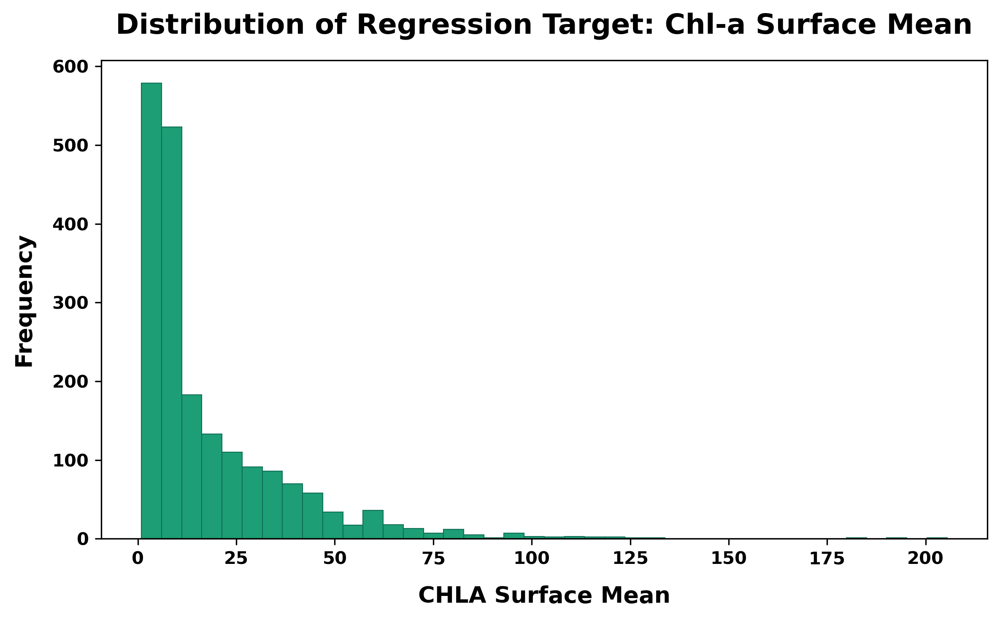

In [8]:

reg_target_col = "CHLAVESurfaceMean"
plt.figure(figsize=(8, 5), dpi=300)
plt.hist(
    csv_data_reg_train[reg_target_col].dropna(),
    bins=40,
    color='#1D9E75',
    edgecolor='#0F6E56',
    linewidth=0.5
    )

plt.title("Distribution of Regression Target: Chl-a Surface Mean", fontsize=16, fontweight='bold', pad=15)
plt.xlabel("CHLA Surface Mean", fontsize=13, fontweight='bold', labelpad=10)
plt.ylabel("Frequency", fontsize=13, fontweight='bold', labelpad=10)

plt.xticks(fontsize=10, fontweight='bold')
plt.yticks(fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()


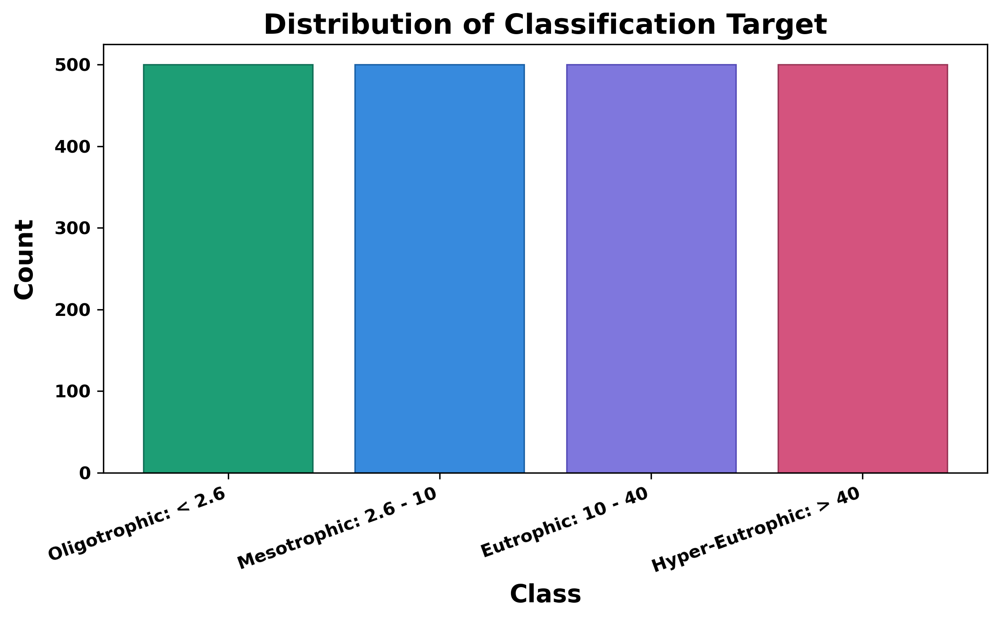

In [9]:

cls_target_col = "CHLAClass"
class_counts = csv_data_classification_train[cls_target_col].value_counts().sort_index()
class_label_map = {
    0: "Oligotrophic: < 2.6",
    1: "Mesotrophic: 2.6 - 10",
    2: "Eutrophic: 10 - 40",
    3: "Hyper-Eutrophic: > 40"
}
class_labels = [class_label_map.get(i, str(i)) for i in class_counts.index]

bar_colors = ['#1D9E75', '#378ADD', '#7F77DD', '#D4537E']
edge_colors = ['#0F6E56', '#185FA5', '#534AB7', '#993556']

plt.figure(figsize=(8, 5), dpi=300)
plt.bar(class_labels, class_counts.values, color=bar_colors, edgecolor=edge_colors, linewidth=0.8)

plt.title("Distribution of Classification Target", fontsize=16, fontweight='bold')
plt.xlabel("Class", fontsize=14, fontweight='bold')
plt.ylabel("Count", fontsize=14, fontweight='bold', labelpad=10)

plt.xticks(rotation=20, ha="right", fontsize=10, fontweight='bold')
plt.yticks(fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig("classification_target_distribution.png", dpi=300, bbox_inches="tight")
plt.show()


### **3. Model Families Used For Emulation**

#### **3.1 What Models are we using and why?**
We used **three tree-based machine learning models** as emulator models:
- **Random Forest**
- **LightGBM**
- **XGBoost**

`Why these Models:`

1. **Interpretation friendly** 
    - The main objective is to understand learned relationships in the simulator, especially through feature importance and partial dependence plots (PDPs).
2. **They handle nonlinear relationships well**
    - The links between environmental drivers, policy scenarios, and chlorophyll response are non-linear.    
3. **They work well for tabular data**
    - Our inputs are structured variables, not images or sequences.
4. **They support both tasks naturally**
    - Regression: estimate continuous chlorophyll-a response
    - Classification: assign trophic-state categories      
5. **They are efficient surrogate models**
    - Their role is to approximate simulator behavior at lower computational cost, making repeated analysis practical.
  
#### **3.2 Random Forest**
- Random Forest is an ensemble of decision trees.
- Instead of relying on one tree, it builds many trees and combines their outputs.
- For regression, it averages the predictions from many trees
- For classification, it uses the majority vote across trees

A single decision tree may overreact to one particular pattern in the data.
Random Forest reduces that risk by asking:

> “What if we build many different trees on slightly different views of the data, and then combine them?”

That is why it is called a forest rather than just a tree.

**Example:**
- Suppose we use:
    - JPO4 - snowpack - sat_def
- One tree may split first on:
    - JPO4
- Another tree may focus more on:
    - snowpack
- A third tree may use:
    - sat_def
- Each tree gives its own prediction
- Final output:
    - regression: average of tree predictions
    - classification: majority vote across trees

#### **3.3 General Idea of Gradient Boosting**

> Instead of building many trees independently and averaging them, gradient boosting builds trees sequentially:


- Build a model and the first tree makes an initial prediction
- the next tree tries to correct the errors of the first
- the next tree corrects what is still wrong and this continues step by step

**Example:** 

- First tree makes an initial prediction
- It works reasonably well for:
    - moderate chlorophyll cases
- But it may miss:
    - high chlorophyll cases
- Second tree focuses more on:
    - those underpredicted high-value cases
- Third tree then tries to fix:
    - the remaining errors and so on.

#### **3.4 LightGBM**

> A gradient boosting framework designed to be efficient and scalable.

It follows the same general boosting idea:
- build trees sequentially
- each new tree tries to improve the current model

But it is **optimized to train faster handle large tabular datasets efficiently**.


#### **3.5 XGBoost**

> A gradient boosting model, but with a strong emphasis on optimization, regularization and robust performance. 

Follows same boosting idea: build trees sequentially to reduce error.

**Often performs well while controlling overfitting carefully.**

### **4. Training Workflow and Reproducibility**

#### **4.1 Data split**
- Dont train and evaluate on same data
- Need three splits:
    - Training Data: Use to fit the model
    - Validation Data - Use during training for evaluation and early stopping
    - Test Data - Use for final evaluation


In [10]:

# define traget columns
classification_target = "CHLAClass"
regression_target = "CHLAVESurfaceMean"

# split data into training, testing
# get training data and later split into train and validation
X_classification = csv_data_classification_train.drop(columns=[classification_target])
y_classification = csv_data_classification_train[classification_target]

# use train_test_split from sklearn -> https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html
X_class_train, X_class_val, y_class_train, y_class_val = train_test_split(
                                                            X_classification,
                                                            y_classification,
                                                            test_size=0.10,
                                                            stratify=y_classification,
                                                            random_state=14912
                                                            )

X_classification_test = csv_data_classification_test.drop(columns=[classification_target])
y_classification_test = csv_data_classification_test[classification_target]


# regression
X_regression = csv_data_reg_train.drop(columns=[regression_target])
y_regression = csv_data_reg_train[regression_target]

X_reg_train, X_reg_val, y_reg_train, y_reg_val = train_test_split(
                                                        X_regression,
                                                        y_regression,
                                                        test_size=0.10,
                                                        random_state=14912
                                                        )

X_regression_test = csv_data_reg_test.drop(columns=[regression_target])
y_regression_test = csv_data_reg_test[regression_target]



print("Classification Data:")
print(f"\tTrain Input: {X_class_train.shape}      - Train Target: {y_class_train.shape}")
print(f"\tValidation Input: {X_class_val.shape}  - Train Target: {y_class_val.shape}")
print(f"\tTest Input: {X_classification_test.shape}        - Test Target: {y_classification_test.shape}")

print("\nRegression Data:")
print(f"\tTrain Input: {X_reg_train.shape}      - Train Target: {y_reg_train.shape}")
print(f"\tValidation Input: {X_reg_val.shape}  - Train Target: {y_reg_val.shape}")
print(f"\tTest Input: {X_regression_test.shape}        - Test Target: {y_regression_test.shape}")


Classification Data:
	Train Input: (1800, 50)      - Train Target: (1800,)
	Validation Input: (200, 50)  - Train Target: (200,)
	Test Input: (400, 50)        - Test Target: (400,)

Regression Data:
	Train Input: (1800, 50)      - Train Target: (1800,)
	Validation Input: (200, 50)  - Train Target: (200,)
	Test Input: (400, 50)        - Test Target: (400,)


#### **4.2 Model Initialization**
##### **4.2.1 Random Forest**

In [11]:

# random forest classifier
rf_clf = RandomForestClassifier(
                n_estimators=100,
                n_jobs=-1,
                # verbose=1,
                random_state=14912
                )

# Random forest regression
rf_reg = RandomForestRegressor(
                n_estimators=100,
                n_jobs=-1,
                # verbose=1,
                random_state=14912
                )

print(rf_clf)
print(rf_reg)


RandomForestClassifier(n_jobs=-1, random_state=14912)
RandomForestRegressor(n_jobs=-1, random_state=14912)


**Random Forest Parameters**
- **n_estimators = 100**
  - number of trees in the forest
  - more trees usually improve stability
  - but also increase training time
- **n_jobs = -1**
  - use all available CPU cores
  - helps speed up training
- **random_state = 14912**
  - fixes the random seed
  - helps make results reproducible

For detailed list of parameters:
- [Random Forest Classifier](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html)
- [Random Forest Regressor](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html)

##### **4.2.2 LightGBM**

In [12]:

# LightGBM classification
lgbm_clf = LGBMClassifier(
                objective="multiclass",
                num_class=4,
                learning_rate=0.05,
                n_estimators=10,      # upper bound, use early stopping
                max_depth=-1,
                subsample=0.8,
                colsample_bytree=0.8,
                device_type="gpu",      # GPU inference/training
                n_jobs=-1,
                random_state=14912,
                )

# LightGBM regression
lgbm_reg = LGBMRegressor(
                objective="regression",   # L2 by default
                learning_rate=0.05,
                n_estimators=10,       # upper bound - early stopping will trim
                max_depth=-1,
                subsample=0.8,
                colsample_bytree=0.8,
                n_jobs=-1,
                random_state=14912,
                )

print(lgbm_clf)
print(lgbm_reg)


LGBMClassifier(colsample_bytree=0.8, device_type='gpu', learning_rate=0.05,
               n_estimators=10, n_jobs=-1, num_class=4, objective='multiclass',
               random_state=14912, subsample=0.8)
LGBMRegressor(colsample_bytree=0.8, learning_rate=0.05, n_estimators=10,
              n_jobs=-1, objective='regression', random_state=14912,
              subsample=0.8)



**LightGBM parameters**

- **objective**
  - tells the model what kind of task it is solving
  - `multiclass` for classification
  - `regression` for regression
- **num_class = 4**
  - tells the model there are 4 trophic-state classes
- **learning_rate = 0.05**
  - controls how quickly the model updates
  - smaller values usually mean slower but more stable learning
- **n_estimators = 10**
  - maximum number of boosting trees
  - this is set high as an upper bound
  - training can stop earlier if validation performance stops improving
- **max_depth = -1**
  - no fixed depth limit
  - allows trees to grow as needed
- **subsample = 0.8**
  - each boosting step uses 80% of the rows
  - helps regularization
- **colsample_bytree = 0.8**
  - each tree uses 80% of the features
  - reduces over-reliance on the same predictors
- **device_type = "gpu"**
  - uses GPU acceleration when available
  - helps training speed
- **n_jobs = -1**
  - uses all available CPU cores where relevant
- **random_state = 14912**
  - fixes randomness for reproducibility

For detailed list of parameters:
- [LGBMRegressor](https://lightgbm.readthedocs.io/en/v3.3.5/pythonapi/lightgbm.LGBMRegressor.html)
- [LGBMClassifier](https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMClassifier.html)

##### **5.3.3 XGBoost**

In [13]:

# XGBoost classification
xgb_clf = xgb.XGBClassifier(
                objective="multi:softprob",
                num_class=4,
                learning_rate=0.05,      # we will use small learning rate since n_estimators are high
                n_estimators=10,      # upper bound, will stop early due to the early stopping criteria 
                max_depth=6,
                subsample=0.8,
                colsample_bytree=0.8,
                tree_method="hist",      # fast histogram algorithm
                n_jobs=-1,
                eval_metric="mlogloss",
                early_stopping_rounds=2,
                random_state=14912,
                )

# XGBoost regression
xgb_reg = xgb.XGBRegressor(
                objective="reg:squarederror",
                learning_rate=0.05,
                n_estimators=10,    # high upper bound, early stopping will cut 
                max_depth=8,
                subsample=0.8,
                colsample_bytree=0.8,
                tree_method="hist",    # use GPU if available
                device="cuda",
                n_jobs=-1,
                eval_metric="rmse",
                early_stopping_rounds=2,
                random_state=14912,
                )

print(xgb_clf)
print(xgb_reg)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=2,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=10, n_jobs=-1, num_class=4, ...)
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device='cuda', early_stopping_rounds=2,
             enable_categorical=False, eval_metric='rmse', f

**XGBoost parameters**
- **objective**
  - defines the task
  - `multi:softprob` for multiclass classification
  - `reg:squarederror` for regression
- **num_class = 4**
  - classification only
  - tells the model how many classes exist
- **learning_rate = 0.05**
  - controls step size during boosting
  - smaller values usually improve stability
- **n_estimators = 10**
  - maximum number of trees
  - early stopping helps stop before reaching this limit
- **max_depth**
  - controls tree complexity
  - `6` for classification
  - `8` for regression
  - deeper trees can capture more complex patterns
- **subsample = 0.8**
  - use 80% of rows per boosting step
  - improves regularization
- **colsample_bytree = 0.8**
  - use 80% of features per tree
  - improves diversity across trees
- **tree_method = "hist"**
  - uses histogram-based tree building
  - faster and more efficient than exact splitting
- **device = "cuda"**
  - regression script uses GPU acceleration
- **eval_metric**
  - metric used during validation
  - `mlogloss` for classification
  - `rmse` for regression
- **early_stopping_rounds = 200**
  - stop if validation does not improve for 200 rounds
  - helps avoid unnecessary training
- **random_state = 14912**
  - ensures reproducibility
 
For detailed list of parameters:
- [XGBoost Parameters](https://xgboost.readthedocs.io/en/stable/parameter.html)



#### **4.4 Model Fitting**

- **Model fitting** means learning patterns from the training data
- The model tries to learn a mapping from:
  - **inputs** --> **target output**
- During fitting:
  - **Random Forest** builds many trees
  - **LightGBM** and **XGBoost** build trees step by step
- The goal is to learn generalized patterns can be used outside of training data with same distribution.

**Model fitting takes time: But why?**

- the **size of the dataset**
- the **number of features**
- the **complexity of the model**
- the **number of trees**
- the **tree depth**
- whether **CPU** or **GPU** is used

In general:

- **Random Forest** can be faster to set up conceptually, but still takes time because it builds many trees
- **Boosting models** can take longer because trees are built **sequentially**

Better to save models rather training everytime. 

##### **4.4.1 Random Forest**

In [14]:

# quick review of classification and regression model initializations
rf_clf = RandomForestClassifier(
                n_estimators=100,
                n_jobs=-1,
                # verbose=1,
                random_state=14912
                )

# Random forest regression
rf_reg = RandomForestRegressor(
                n_estimators=100,
                n_jobs=-1,
                # verbose=1,
                random_state=14912
                )


# Random Forest Classifier
print("Fitting Random Forest Classifier...")
start_time = time.time()

rf_clf.fit(X_class_train, y_class_train) # rf_clf.fit learns the classification 

rf_clf_train_time = time.time() - start_time
print(f"Random Forest Classifier training finished in {rf_clf_train_time:.2f} seconds.")

# random forest regressor
print("Fitting Random Forest Regressor...")
start_time = time.time()

rf_reg.fit(X_reg_train, y_reg_train) # rf_reg.fit learns the regression 

rf_reg_train_time = time.time() - start_time
print(f"Random Forest Regressor training finished in {rf_reg_train_time:.2f} seconds.")


Fitting Random Forest Classifier...
Random Forest Classifier training finished in 0.31 seconds.
Fitting Random Forest Regressor...
Random Forest Regressor training finished in 0.57 seconds.


##### **4.4.2 LightGBM**

In [15]:

# quick recall of LightGBM initialization
# LightGBM classification
lgbm_clf = LGBMClassifier(
                objective="multiclass",
                num_class=4,
                learning_rate=0.1,
                n_estimators=10,      # upper bound, use early stopping
                max_depth=-1,
                subsample=0.8,
                colsample_bytree=0.8,
                # device_type="gpu",      # GPU inference/training
                n_jobs=-1,
                random_state=14912,
                )

# LightGBM regression
lgbm_reg = LGBMRegressor(
                objective="regression",   # L2 by default
                learning_rate=0.1,
                n_estimators=10,       # upper bound - early stopping will trim
                max_depth=-1,
                subsample=0.8,
                colsample_bytree=0.8,
                # device_type="gpu", 
                n_jobs=-1,
                random_state=14912,
                )


# LightGBM classifier
print("Fitting LightGBM Classifier...")
start_time = time.time()

lgbm_clf.fit(
            X_class_train,
            y_class_train,
            eval_set=[(X_class_val, y_class_val)],
            eval_metric="multi_logloss",
            callbacks=[
                    early_stopping(stopping_rounds=2, verbose=False),
                    log_evaluation(period=2)
                    ]
            )

lgbm_clf_train_time = time.time() - start_time
print(f"LightGBM Classifier training finished in {lgbm_clf_train_time:.2f} seconds.")


# LightGBM regression
print("Fitting LightGBM Regressor...")
start_time = time.time()

lgbm_reg.fit(
            X_reg_train,
            y_reg_train,
            eval_set=[(X_reg_val, y_reg_val)],
            eval_metric="rmse",
            callbacks=[
                    early_stopping(stopping_rounds=2, verbose=False),
                    log_evaluation(period=2)
                    ]
            )

lgbm_reg_train_time = time.time() - start_time
print(f"LightGBM Regressor training finished in {lgbm_reg_train_time:.2f} seconds.")


Fitting LightGBM Classifier...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6150
[LightGBM] [Info] Number of data points in the train set: 1800, number of used features: 49
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[2]	valid_0's multi_logloss: 1.17595
[4]	valid_0's multi_logloss: 1.03683
[6]	valid_0's multi_logloss: 0.942199
[8]	valid_0's multi_logloss: 0.868743
[10]	valid_0's multi_logloss: 0.812399
LightGBM Classifier training finished in 1.07 seconds.
Fitting LightGBM Regressor...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 

##### **4.4.3 XGBoost**

In [16]:

# quick view of XGBoost initialization
# XGBoost classification
xgb_clf = xgb.XGBClassifier(
                objective="multi:softprob",
                num_class=4,
                learning_rate=0.1,      # we will use high learning rate since n_estimators are low
                n_estimators=10,      # high upper bound, will stop early due to the early stopping criteria set to 2
                max_depth=4,
                subsample=0.8,
                colsample_bytree=0.8,
                tree_method="hist",      # fast histogram algorithm
                # device="cuda",
                n_jobs=-1,
                eval_metric="mlogloss",
                early_stopping_rounds=2,
                random_state=14912,
                )

# XGBoost regression
xgb_reg = xgb.XGBRegressor(
                objective="reg:squarederror",
                learning_rate=0.1,
                n_estimators=10,    # high upper bound, early stopping will cut 
                max_depth=4,
                subsample=0.8,
                colsample_bytree=0.8,
                tree_method="hist",    # use GPU if available
                # device="cuda",
                n_jobs=-1,
                eval_metric="rmse",
                early_stopping_rounds=2,
                random_state=14912,
                )

# model fitting
# XGBoost classifier
print("Fitting XGBoost Classifier...")
start_time = time.time()

xgb_clf.fit(
            X_class_train,
            y_class_train,
            eval_set=[(X_class_val, y_class_val)],
            verbose=0
            )

xgb_clf_train_time = time.time() - start_time
print(f"XGBoost Classifier training finished in {xgb_clf_train_time:.2f} seconds.")


# XGBoost regressor
print("Fitting XGBoost Regressor...")
start_time = time.time()

xgb_reg.fit(
            X_reg_train,
            y_reg_train,
            eval_set=[(X_reg_val, y_reg_val)],
            verbose=0
            )

xgb_reg_train_time = time.time() - start_time
print(f"XGBoost Regressor training finished in {xgb_reg_train_time:.2f} seconds.")


Fitting XGBoost Classifier...
XGBoost Classifier training finished in 9.92 seconds.
Fitting XGBoost Regressor...
XGBoost Regressor training finished in 2.31 seconds.


##### **4.4.4 Fitting Time Difference Across Models**
- **Random Forest**
  - many trees built independently
  - parallel computation helps
- **LightGBM**
  - boosting model
  - trees built sequentially
  - can be faster than older boosting methods
  - GPU support can help
- **XGBoost**
  - boosting model
  - strong optimization and regularization
  - can take longer when many boosting rounds are allowed
- Overall model fitting depends:
    - data size
    - model type
    - number of trees
    - tree depth
    - validation logic
    - hardware

### **5. Model Saving - Loading - Evaluation**

In [17]:

# model weights paths
weights_path = Path("./Model_Weights")

rf_class_path = weights_path / 'RF/Classification'
rf_regress_path = weights_path / 'RF/Regression'
rf_class_path.mkdir(parents=True, exist_ok=True)
rf_regress_path.mkdir(parents=True, exist_ok=True)

lightgbm_class_path = weights_path / 'LightGBM/Classification'
lightgbm_regress_path = weights_path / 'LightGBM/Regression'
lightgbm_class_path.mkdir(parents=True, exist_ok=True)
lightgbm_regress_path.mkdir(parents=True, exist_ok=True)

xgb_class_path = weights_path / 'XGBoost/Classification'
xgb_regress_path = weights_path / 'XGBoost/Regression'
xgb_class_path.mkdir(parents=True, exist_ok=True)
xgb_regress_path.mkdir(parents=True, exist_ok=True)


#### **5.1 Random Forest**
##### **5.1.1 Random Forest Classification**

Random Forest Classification Metrics
 Precision: 0.6927
 Recall:    0.6925
 F1 Score:  0.6914

Classification Report:

              precision    recall  f1-score   support

           0     0.9149    0.8600    0.8866       100
           1     0.6822    0.7300    0.7053       100
           2     0.5281    0.4700    0.4974       100
           3     0.6455    0.7100    0.6762       100

    accuracy                         0.6925       400
   macro avg     0.6927    0.6925    0.6914       400
weighted avg     0.6927    0.6925    0.6914       400



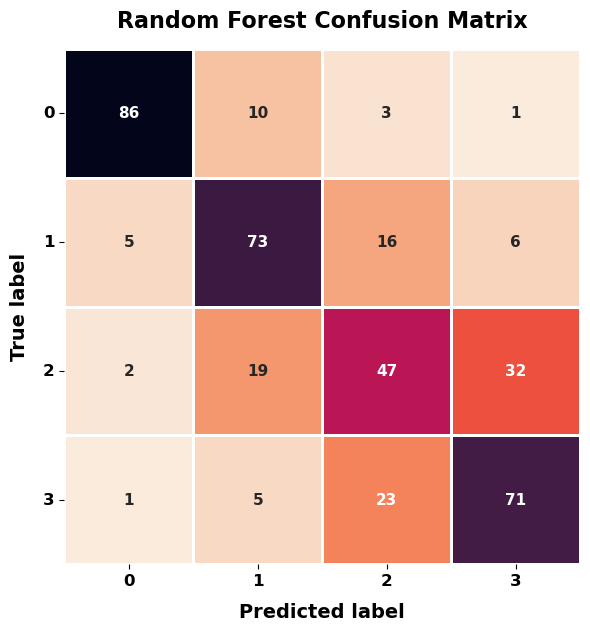

In [18]:

# save and load the weights
joblib.dump(rf_clf, rf_class_path / "rf_classifier.joblib")
rf_clf_loaded = joblib.load(rf_class_path / "rf_classifier.joblib")

# prediction using .predict
y_pred_rf_clf = rf_clf_loaded.predict(X_classification_test)

precision = precision_score(y_classification_test, y_pred_rf_clf, average="macro", zero_division=0)
recall = recall_score(y_classification_test, y_pred_rf_clf, average="macro", zero_division=0)
f1 = f1_score(y_classification_test, y_pred_rf_clf, average="macro", zero_division=0)

print("Random Forest Classification Metrics")
print(f" Precision: {precision:.4f}")
print(f" Recall:    {recall:.4f}")
print(f" F1 Score:  {f1:.4f}")

print("\nClassification Report:\n")
print(classification_report(y_classification_test, y_pred_rf_clf, digits=4, zero_division=0))

# confusion matrix visualization
cm = confusion_matrix(y_classification_test, y_pred_rf_clf)
plt.figure(figsize=(6, 8))
ax = sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="rocket_r", # YlOrBr, Greys, Blues, PuBuGn, rocket_r
        cbar=False,
        square=True,
        linewidths=1.9,
        linecolor="white",
        annot_kws={"size": 11, "weight": "bold"}
        )

ax.set_title("Random Forest Confusion Matrix", fontsize=16, weight="bold", pad=15)
ax.set_xlabel("Predicted label", fontsize=14, weight="bold", labelpad=10)
ax.set_ylabel("True label", fontsize=14, weight="bold", labelpad=10)
ax.set_xticklabels([0, 1, 2, 3], rotation=0, fontsize=12, fontweight='bold')
ax.set_yticklabels([0, 1, 2, 3], rotation=0, fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig
plt.show()


##### **5.1.2 Random Forest Regression**

In [19]:

# a few helper functions for evaluation 
def safe_mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    mask = np.abs(y_true) > eps
    if mask.sum() == 0:
        return np.nan

    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100.0


def nse(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    denominator = np.sum((y_true - np.mean(y_true)) ** 2)

    if denominator == 0:
        return np.nan

    return 1.0 - np.sum((y_true - y_pred) ** 2) / denominator


First 5 predictions: [56.5125889  22.49118956  7.82964257 15.4867114  22.74964245]
First 5 actual values: [57.09239995 39.23145115  5.57894895 10.54324243  8.92187621]
Random Forest Regression Metrics
MAE                 : 7.822292
RMSE                : 14.099166
Median_AE           : 4.081809
Bias                : 1.154912
MAPE                : 63.285633
R2                  : 0.530459
ExplainedVariance   : 0.533609
Pearson_r           : 0.730606
NSE                 : 0.530459


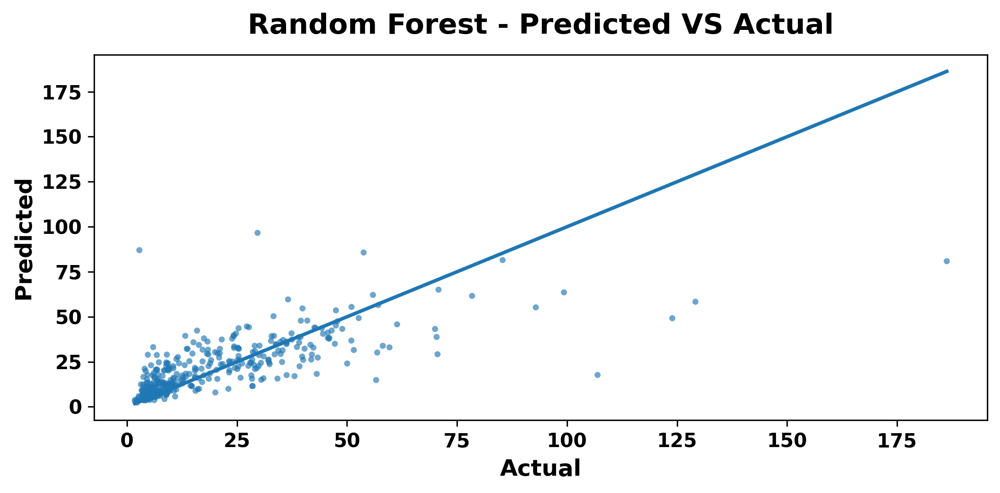

In [20]:

# define the paths to save the weights and load the weights
rf_reg_model_path = rf_regress_path / "rf_regressor.joblib"
joblib.dump(rf_reg, rf_reg_model_path) # save the weights
rf_reg_loaded = joblib.load(rf_reg_model_path) # load the weights

# Evaluation on the hold out test set
y_pred_rf_reg = rf_reg_loaded.predict(X_regression_test)
print("First 5 predictions:", y_pred_rf_reg[:5])
print("First 5 actual values:", np.asarray(y_regression_test)[:5])


# regression metrics
mae = mean_absolute_error(y_regression_test, y_pred_rf_reg)
rmse = root_mean_squared_error(y_regression_test, y_pred_rf_reg)
medae = median_absolute_error(y_regression_test, y_pred_rf_reg)
r2 = r2_score(y_regression_test, y_pred_rf_reg)
evs = explained_variance_score(y_regression_test, y_pred_rf_reg)

bias = float(np.mean(y_pred_rf_reg - y_regression_test))
mape = safe_mape(y_regression_test, y_pred_rf_reg)
rho = float(np.corrcoef(y_regression_test, y_pred_rf_reg)[0, 1])
nse_value = nse(y_regression_test, y_pred_rf_reg)

# define the results for easier print
rf_reg_results = {
    "MAE": round(mae, 6),
    "RMSE": round(rmse, 6),
    "Median_AE": round(medae, 6),
    "Bias": round(bias, 6),
    "MAPE": round(mape, 6),
    "R2": round(r2, 6),
    "ExplainedVariance": round(evs, 6),
    "Pearson_r": round(rho, 6),
    "NSE": round(nse_value, 6),
    }

print("Random Forest Regression Metrics")
for k, v in rf_reg_results.items():
    print(f"{k:20s}: {v}")


# Lets also visualize the results in a scatter plot
y_true = np.asarray(y_regression_test)
y_pred = np.asarray(y_pred_rf_reg)

min_val = min(y_true.min(), y_pred.min())
max_val = max(y_true.max(), y_pred.max())

plt.figure(figsize=(8, 4), dpi=300)

# scatter points
plt.scatter(
    y_true,
    y_pred,
    s=12,
    alpha=0.65,
    edgecolor="none"
    )

# draw the reference line too
plt.plot(
    [min_val, max_val],
    [min_val, max_val],
    linewidth=2,
    label="1:1 Line"
    )

plt.title("Random Forest - Predicted VS Actual", fontsize=16, weight="bold", pad=12)
plt.xlabel("Actual", fontsize=13, weight="bold")
plt.ylabel("Predicted", fontsize=13, weight="bold")

plt.xticks(fontsize=11, weight="bold")
plt.yticks(fontsize=11, weight="bold")

plt.grid(False)
plt.tight_layout()

plt.show()



#### **5.2 LightGBM**

##### **5.2.1 LightGBM Classification**


LightGBM Classification Metrics
 Precision: 0.7058
 Recall:    0.7025
 F1 Score:  0.7030

Classification Report:

              precision    recall  f1-score   support

           0     0.9255    0.8700    0.8969       100
           1     0.6875    0.6600    0.6735       100
           2     0.5521    0.5300    0.5408       100
           3     0.6579    0.7500    0.7009       100

    accuracy                         0.7025       400
   macro avg     0.7058    0.7025    0.7030       400
weighted avg     0.7058    0.7025    0.7030       400



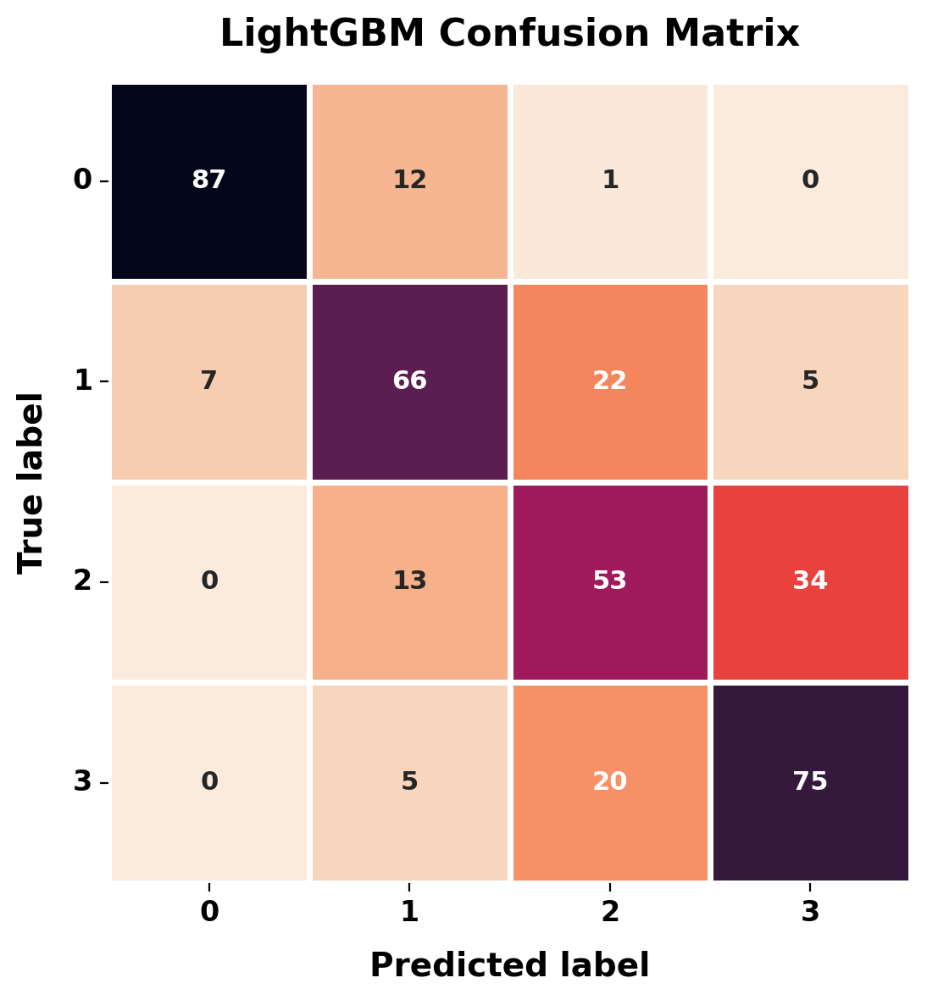

In [21]:

# define the paths for weights saving, loading
lgbm_class_model_path = lightgbm_class_path / "lightgbm_classifier.joblib"
joblib.dump(lgbm_clf, lgbm_class_model_path)
lgbm_clf_loaded = joblib.load(lgbm_class_model_path)

# classification evaluation
y_pred_lgbm_clf = lgbm_clf_loaded.predict(X_classification_test)

# evaluate the performance
precision = precision_score(y_classification_test, y_pred_lgbm_clf, average="macro", zero_division=0)
recall = recall_score(y_classification_test, y_pred_lgbm_clf, average="macro", zero_division=0)
f1 = f1_score(y_classification_test, y_pred_lgbm_clf, average="macro", zero_division=0)

print("LightGBM Classification Metrics")
print(f" Precision: {precision:.4f}")
print(f" Recall:    {recall:.4f}")
print(f" F1 Score:  {f1:.4f}")

print("\nClassification Report:\n")
print(classification_report(y_classification_test, y_pred_lgbm_clf, digits=4, zero_division=0))

cm = confusion_matrix(y_classification_test, y_pred_lgbm_clf)
plt.figure(figsize=(8, 6), dpi=200)
ax = sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="rocket_r", # YlOrBr, Greys, Blues, PuBuGn, rocket_r
        cbar=False,
        square=True,
        linewidths=1.9,
        linecolor="white",
        annot_kws={"size": 11, "weight": "bold"}
        )

ax.set_title("LightGBM Confusion Matrix", fontsize=16, weight="bold", pad=15)
ax.set_xlabel("Predicted label", fontsize=14, weight="bold", labelpad=10)
ax.set_ylabel("True label", fontsize=14, weight="bold", labelpad=10)
ax.set_xticklabels([0, 1, 2, 3], rotation=0, fontsize=12, fontweight='bold')
ax.set_yticklabels([0, 1, 2, 3], rotation=0, fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


##### **5.2.2 LightGBM Regression**

First 5 predictions: [45.26406794 21.82962969 11.66223885 21.51574835 20.24070097]
First 5 actual values: [57.09239995 39.23145115  5.57894895 10.54324243  8.92187621]
LightGBM Regression Metrics
MAE                 : 9.644792
RMSE                : 15.694764
Median_AE           : 6.718665
Bias                : -0.302498
MAPE                : 87.721518
R2                  : 0.418169
ExplainedVariance   : 0.418386
Pearson_r           : 0.716182
NSE                 : 0.418169


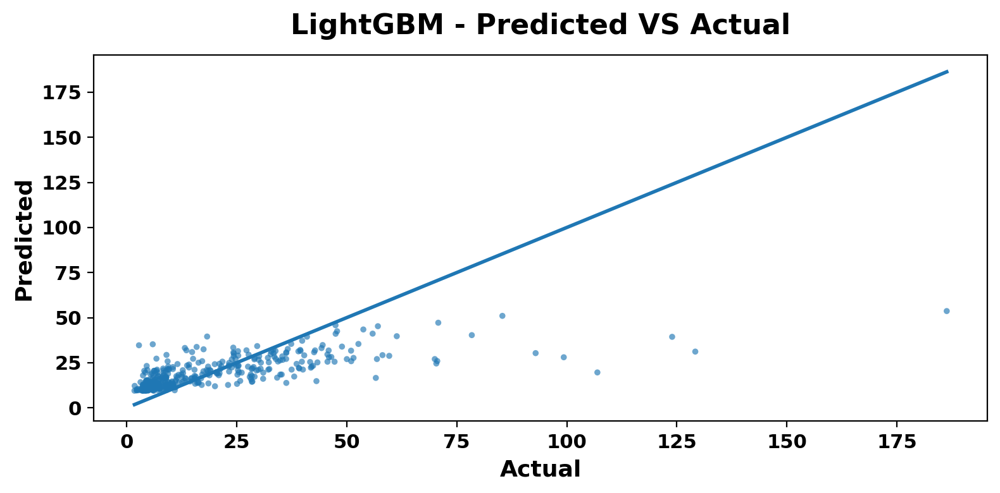

In [22]:

# save and load the weights
lgbm_reg_model_path = lightgbm_regress_path / "lightgbm_regressor.joblib"
joblib.dump(lgbm_reg, lgbm_reg_model_path)
lgbm_reg_loaded = joblib.load(lgbm_reg_model_path)

# prediction
y_pred_lgbm_reg = lgbm_reg_loaded.predict(X_regression_test)

print("First 5 predictions:", y_pred_lgbm_reg[:5])
print("First 5 actual values:", np.asarray(y_regression_test)[:5])

mae = mean_absolute_error(y_regression_test, y_pred_lgbm_reg)
rmse = root_mean_squared_error(y_regression_test, y_pred_lgbm_reg)
medae = median_absolute_error(y_regression_test, y_pred_lgbm_reg)
r2 = r2_score(y_regression_test, y_pred_lgbm_reg)
evs = explained_variance_score(y_regression_test, y_pred_lgbm_reg)

bias = float(np.mean(y_pred_lgbm_reg - y_regression_test))
mape = safe_mape(y_regression_test, y_pred_lgbm_reg)
rho = float(np.corrcoef(y_regression_test, y_pred_lgbm_reg)[0, 1])
nse_value = nse(y_regression_test, y_pred_lgbm_reg)

lgbm_reg_results = {
                    "MAE": round(mae, 6),
                    "RMSE": round(rmse, 6),
                    "Median_AE": round(medae, 6),
                    "Bias": round(bias, 6),
                    "MAPE": round(mape, 6),
                    "R2": round(r2, 6),
                    "ExplainedVariance": round(evs, 6),
                    "Pearson_r": round(rho, 6),
                    "NSE": round(nse_value, 6),
                    }

print("LightGBM Regression Metrics")
for k, v in lgbm_reg_results.items():
    print(f"{k:20s}: {v}")

# scatter plot visualization
y_true = np.asarray(y_regression_test)
y_pred = np.asarray(y_pred_lgbm_reg)

min_val = min(y_true.min(), y_pred.min())
max_val = max(y_true.max(), y_pred.max())

plt.figure(figsize=(8, 4), dpi=200)
plt.scatter(y_true, y_pred, s=12, alpha=0.65, edgecolor="none")
plt.plot([min_val, max_val], [min_val, max_val], linewidth=2, label="1:1 Line")

plt.title("LightGBM - Predicted VS Actual", fontsize=16, weight="bold", pad=12)
plt.xlabel("Actual", fontsize=13, weight="bold")
plt.ylabel("Predicted", fontsize=13, weight="bold")

plt.xticks(fontsize=11, weight="bold")
plt.yticks(fontsize=11, weight="bold")

plt.grid(False)
plt.tight_layout()
plt.show()


##### **5.3.1 XGBoost Classification**

XGBoost Classification Metrics
 Precision: 0.7018
 Recall:    0.7000
 F1 Score:  0.6976

Classification Report:

              precision    recall  f1-score   support

           0     0.9247    0.8600    0.8912       100
           1     0.6339    0.7100    0.6698       100
           2     0.5875    0.4700    0.5222       100
           3     0.6609    0.7600    0.7070       100

    accuracy                         0.7000       400
   macro avg     0.7018    0.7000    0.6976       400
weighted avg     0.7018    0.7000    0.6976       400



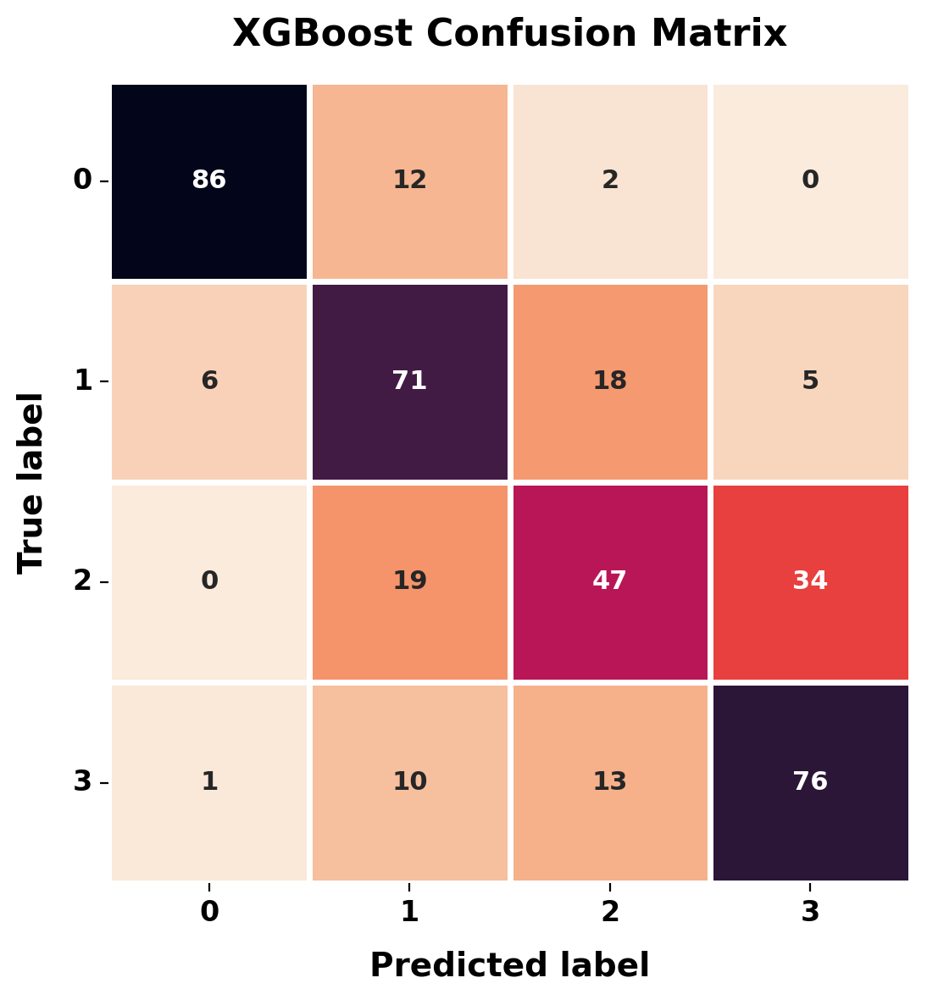

In [23]:

# weights saving and loading
xgb_class_model_path = xgb_class_path / "xgboost_classifier.joblib"
joblib.dump(xgb_clf, xgb_class_model_path)
xgb_clf_loaded = joblib.load(xgb_class_model_path)

# test predictions
y_pred_xgb_clf = xgb_clf_loaded.predict(X_classification_test)

# evaluate the performance
precision = precision_score(y_classification_test, y_pred_xgb_clf, average="macro", zero_division=0)
recall = recall_score(y_classification_test, y_pred_xgb_clf, average="macro", zero_division=0)
f1 = f1_score(y_classification_test, y_pred_xgb_clf, average="macro", zero_division=0)

print("XGBoost Classification Metrics")
print(f" Precision: {precision:.4f}")
print(f" Recall:    {recall:.4f}")
print(f" F1 Score:  {f1:.4f}")

print("\nClassification Report:\n")
print(classification_report(y_classification_test, y_pred_xgb_clf, digits=4, zero_division=0))

# confusion matrix visualization
cm = confusion_matrix(y_classification_test, y_pred_xgb_clf)

plt.figure(figsize=(8, 6), dpi=200)
ax = sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="rocket_r",
        cbar=False,
        square=True,
        linewidths=1.9,
        linecolor="white",
        annot_kws={"size": 11, "weight": "bold"}
        )

ax.set_title("XGBoost Confusion Matrix", fontsize=16, weight="bold", pad=15)
ax.set_xlabel("Predicted label", fontsize=14, weight="bold", labelpad=10)
ax.set_ylabel("True label", fontsize=14, weight="bold", labelpad=10)

ax.set_xticklabels([0, 1, 2, 3], rotation=0, fontsize=12, fontweight="bold")
ax.set_yticklabels([0, 1, 2, 3], rotation=0, fontsize=12, fontweight="bold")

plt.tight_layout()
plt.show()


##### **5.3.2 XGBoost Regression**

First 5 predictions: [32.81663  19.24185  13.724533 22.281021 15.963559]
First 5 actual values: [57.09239995 39.23145115  5.57894895 10.54324243  8.92187621]
XGBoost Regression Metrics
MAE                 : 10.151933
RMSE                : 16.115907
Median_AE           : 7.332896
Bias                : -0.199209
MAPE                : 92.32568
R2                  : 0.386526
ExplainedVariance   : 0.386619
Pearson_r           : 0.688332
NSE                 : 0.386526


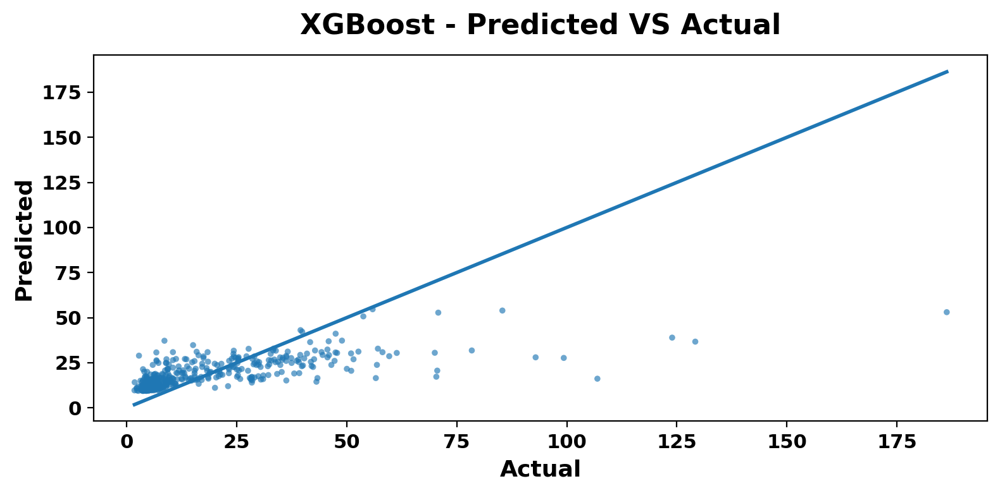

In [24]:

# weights saving and loading
xgb_reg_model_path = xgb_regress_path / "xgboost_regressor.joblib"
joblib.dump(xgb_reg, xgb_reg_model_path)
xgb_reg_loaded = joblib.load(xgb_reg_model_path)

# test predictions
y_pred_xgb_reg = xgb_reg_loaded.predict(X_regression_test)

print("First 5 predictions:", y_pred_xgb_reg[:5])
print("First 5 actual values:", np.asarray(y_regression_test)[:5])

# next - regression metrics
mae = mean_absolute_error(y_regression_test, y_pred_xgb_reg)
rmse = root_mean_squared_error(y_regression_test, y_pred_xgb_reg)
medae = median_absolute_error(y_regression_test, y_pred_xgb_reg)
r2 = r2_score(y_regression_test, y_pred_xgb_reg)
evs = explained_variance_score(y_regression_test, y_pred_xgb_reg)

bias = float(np.mean(y_pred_xgb_reg - y_regression_test))
mape = safe_mape(y_regression_test, y_pred_xgb_reg)
rho = float(np.corrcoef(y_regression_test, y_pred_xgb_reg)[0, 1])
nse_value = nse(y_regression_test, y_pred_xgb_reg)

xgb_reg_results = {
        "MAE": round(mae, 6),
        "RMSE": round(rmse, 6),
        "Median_AE": round(medae, 6),
        "Bias": round(bias, 6),
        "MAPE": round(mape, 6),
        "R2": round(r2, 6),
        "ExplainedVariance": round(evs, 6),
        "Pearson_r": round(rho, 6),
        "NSE": round(nse_value, 6),
        }

print("XGBoost Regression Metrics")
for k, v in xgb_reg_results.items():
    print(f"{k:20s}: {v}")


# lastly - scatter plot
y_true = np.asarray(y_regression_test)
y_pred = np.asarray(y_pred_xgb_reg)

min_val = min(y_true.min(), y_pred.min())
max_val = max(y_true.max(), y_pred.max())

plt.figure(figsize=(8, 4), dpi=200)
plt.scatter(y_true, y_pred, s=12, alpha=0.65, edgecolor="none")
plt.plot([min_val, max_val], [min_val, max_val], linewidth=2, label="1:1 Line")

plt.title("XGBoost - Predicted VS Actual", fontsize=16, weight="bold", pad=12)
plt.xlabel("Actual", fontsize=13, weight="bold")
plt.ylabel("Predicted", fontsize=13, weight="bold")

plt.xticks(fontsize=11, weight="bold")
plt.yticks(fontsize=11, weight="bold")

plt.grid(False)
plt.tight_layout()
plt.show()


### **6. Feature Importance Analysis**

#### **6.1 What is Feature Importance?**

- Feature importance helps **answer**:
  **Which input variables does the trained emulator rely on most when making predictions?**
- We have input features:
  - environmental drivers
  - hydrological variables
  - climate-related variables
  - land-use factors
  - policy/scenario variables
- Feature importance gives a ranked list of predictors that were useful to the trained model.
- In our context, this supports emulator-based teleconnection discovery by highlighting distant or indirect drivers linked to local water-quality outcomes.
- Important caution:
  - high importance means predictive usefulness inside the trained emulator
  - it does **not** automatically imply real-world causality

#### **6.2 How is feature importance computed**
- Tree-based models make predictions by repeatedly splitting the data.
- At each split, the model selects:
  - one feature
  - one threshold
  - the split that best improves prediction
- Example split questions:
  - Is `JPO4` above a certain value?
  - Is snowpack below a certain value?
  - Is the policy reduction level high or low?
- A feature receives high importance when it repeatedly helps the model make better splits.
- For classification:
  - better splits separate classes more clearly
- For regression:
  - better splits reduce prediction error or target variance
- General workflow: `train model ---> extract importance scores --> rank features --> visualize top features --> interpret importance plots`



In [25]:

def plot_feature_importance_barh(
    imp_df,
    value_col,
    title,
    xlabel,
    xerr_col=None,
    figsize_width=12,
    dpi=300
    ):
    
    fig, ax = plt.subplots(figsize=(figsize_width, max(6, len(imp_df) * 0.25)), dpi=300)
    if xerr_col is not None:
        ax.barh(
            imp_df.index,
            imp_df[value_col],
            xerr=imp_df[xerr_col],
            align="center",
            ecolor="black",
            error_kw={"capsize": 3, "elinewidth": 1}
            )
    else:
        ax.barh(
            imp_df.index,
            imp_df[value_col],
            align="center"
            )

    ax.set_title(title, fontsize=18, fontweight="bold", pad=12)
    ax.set_xlabel(xlabel, fontsize=14, fontweight="bold", labelpad=12)
    ax.set_ylabel("Features", fontsize=16, fontweight="bold", labelpad=10)

    tick_size = 12
    for t in ax.get_xticklabels():
        t.set_fontsize(tick_size)
        t.set_fontweight("bold")

    for t in ax.get_yticklabels():
        t.set_fontsize(tick_size)
        t.set_fontweight("bold")

    fig.tight_layout()
    plt.show()


#### **6.3 Random Forest Feature Importance**

- Random Forest can use different feature-importance approaches.
- Common options include:
  - **Mean Decrease in Impurity (MDI)**
  - **Permutation importance**    
- **Mean Decrease in Impurity (MDI):**
  - measures how much each feature reduces impurity across all trees
  - fast and easy to compute
- **Permutation importance:**
  - shuffles one feature at a time
  - checks how much model performance decreases
- In this notebook, we use:
  **Mean Decrease in Impurity (MDI)**
- Useful links:
  - [scikit-learn: Mean Decrease in Impurity](https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html)
  - [scikit-learn: Permutation importance](https://scikit-learn.org/stable/modules/permutation_importance.html)

,mean,std
snowpack,0.164981,0.073238
JPO4,0.113513,0.042932
JPOP,0.056999,0.027501
JPON,0.056711,0.025844
sat_def,0.049854,0.021294
evap,0.046802,0.021296
POPR,0.045233,0.013464
%sat_area,0.043203,0.019097
PO4T2R,0.035645,0.011463
baseflow,0.033512,0.014772


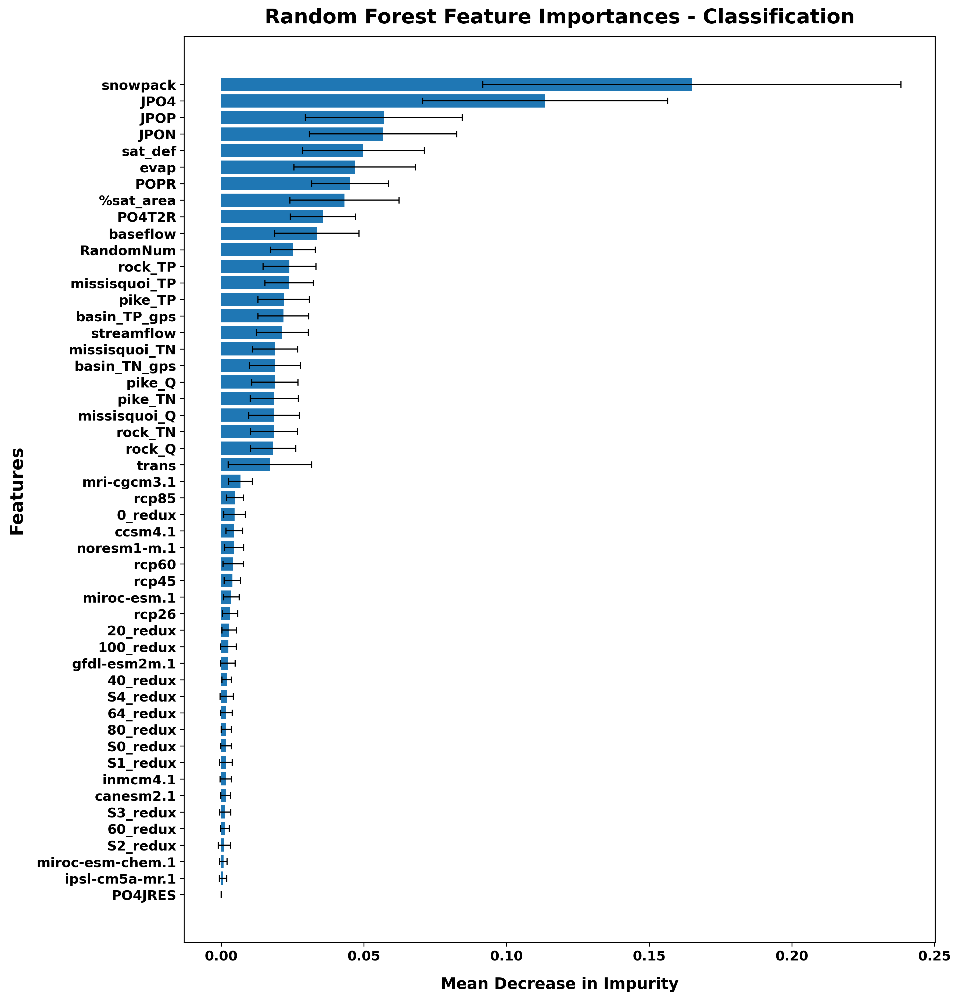

In [26]:

# RF Classificatin Feature Importance Plot
# laod the model and get the feature importance
rf_clf_loaded = joblib.load(rf_class_path / "rf_classifier.joblib")
imp_mean = rf_clf_loaded.feature_importances_
imp_std = np.std([est.feature_importances_ for est in rf_clf_loaded.estimators_], axis=0)

rf_clf_imp_df = (
    pd.DataFrame(
        {
            "mean": imp_mean,
            "std": imp_std
        },
        index=X_classification_test.columns
    )
    .sort_values("mean", ascending=True)
    )

display(rf_clf_imp_df.sort_values("mean", ascending=False).head(15))

plot_feature_importance_barh(
    imp_df=rf_clf_imp_df,
    value_col="mean",
    xerr_col="std",
    title="Random Forest Feature Importances - Classification",
    xlabel="Mean Decrease in Impurity",
    )


,mean,std
JPO4,0.255551,0.038410
POPR,0.094581,0.034570
sat_def,0.089752,0.032222
JPON,0.078226,0.028546
JPOP,0.076221,0.036326
PO4T2R,0.067013,0.021797
evap,0.055211,0.024231
snowpack,0.045029,0.021694
%sat_area,0.036261,0.030653
RandomNum,0.025705,0.013667


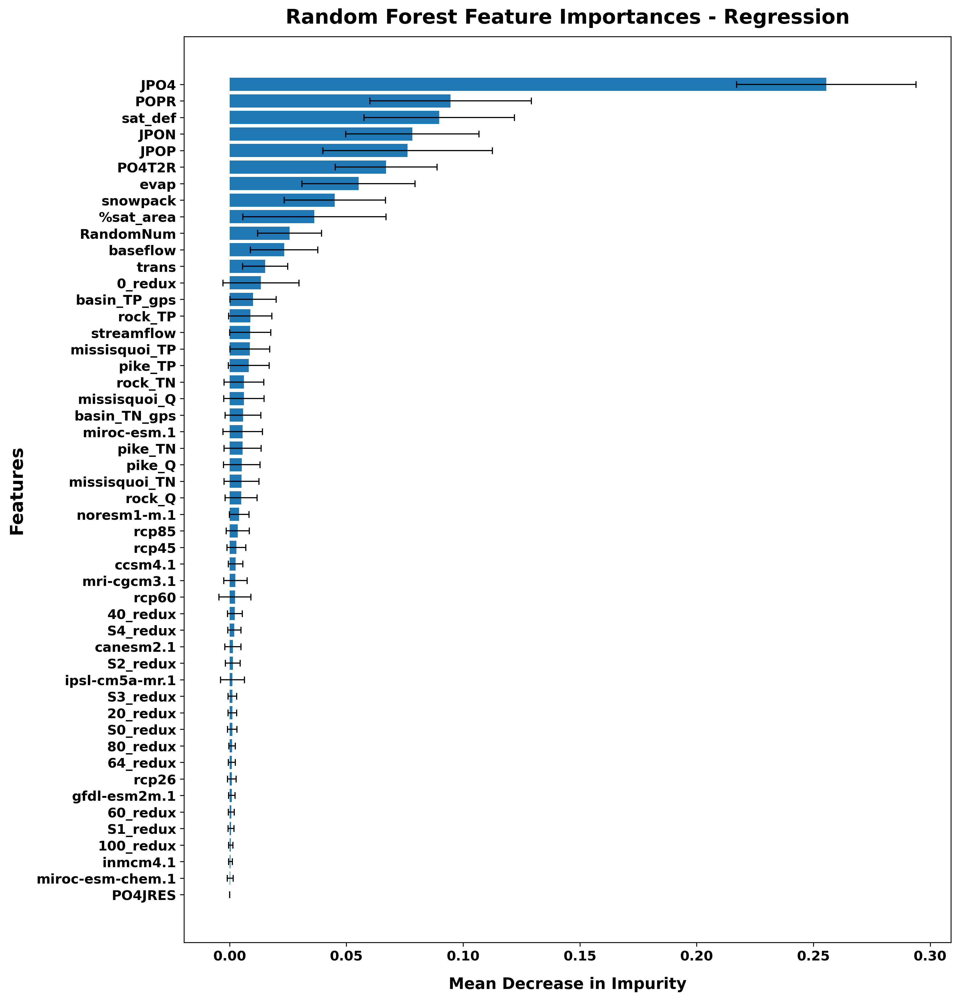

In [27]:

# RF Regression Feature Importance Plot
rf_reg_loaded = joblib.load(rf_reg_model_path) # load the weights
imp_mean = rf_reg_loaded.feature_importances_
imp_std = np.std([est.feature_importances_ for est in rf_reg_loaded.estimators_], axis=0)

rf_reg_imp_df = (
        pd.DataFrame(
            {
                "mean": imp_mean,
                "std": imp_std
            },
            index=X_regression_test.columns).sort_values("mean", ascending=True)
        )

display(rf_reg_imp_df.sort_values("mean", ascending=False).head(15))

plot_feature_importance_barh(
    imp_df=rf_reg_imp_df,
    value_col="mean",
    xerr_col="std",
    title="Random Forest Feature Importances - Regression",
    xlabel="Mean Decrease in Impurity",
    )


#### **6.4 Feature importance in LightGBM**

- LightGBM provides different feature-importance options.
- Common options include:
  - **split importance**
  - **gain importance**
- **Split importance:**
  - counts how many times a feature is used in tree splits
  - simple and easy to understand
  - does not measure how much the split improved the model
- **Gain importance:**
  - measures total improvement in the objective from splits using that feature
  - usually more informative than split count
  - better reflects how useful the feature was during boosting
- In this notebook, we use:
  **Gain importance**
- Useful links:
  - [LightGBM: LGBMClassifier importance_type](https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMClassifier.html)
  - [LightGBM: plot_importance](https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.plot_importance.html)

,gain
snowpack,0.294625
JPO4,0.185367
POPR,0.086749
JPON,0.075325
JPOP,0.063628
sat_def,0.060605
evap,0.042117
%sat_area,0.039488
PO4T2R,0.033290
baseflow,0.033241


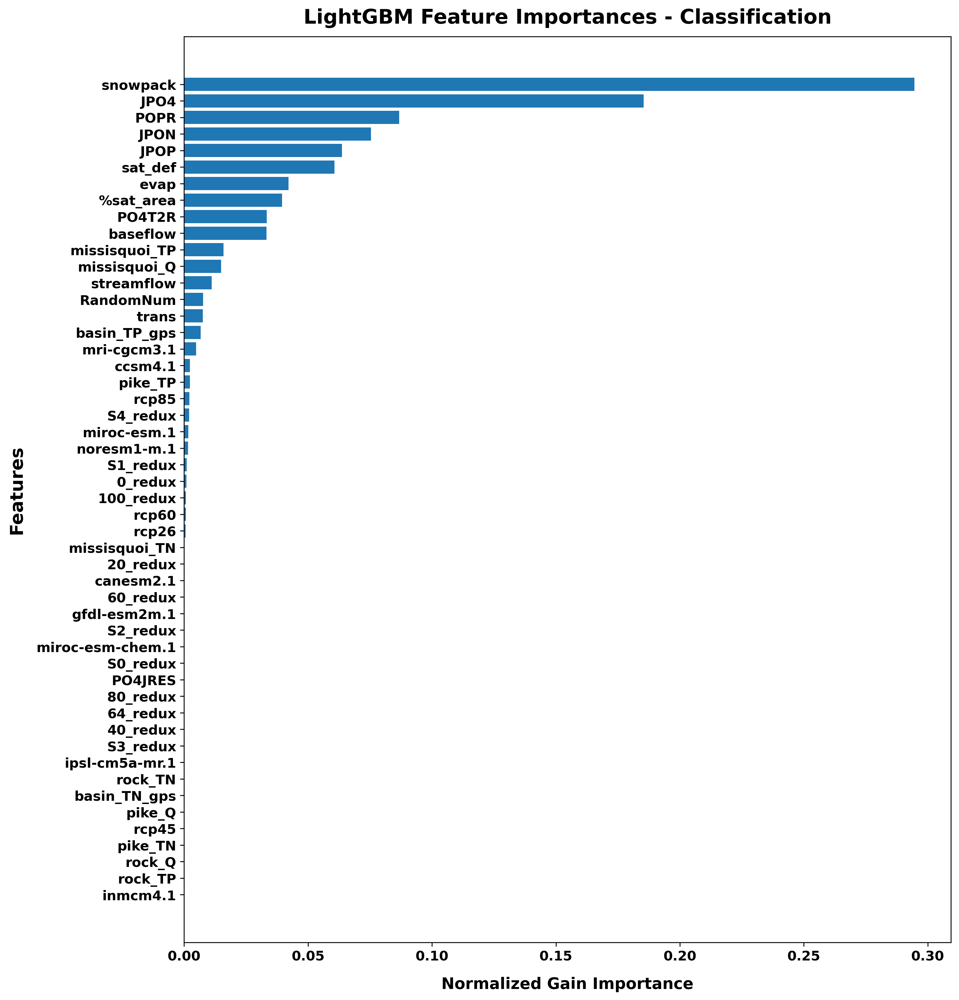

In [28]:

# LightGBM Classification Feature Importance Plot
# load the model 
lgbm_clf_loaded = joblib.load(lgbm_class_model_path)

booster = getattr(lgbm_clf_loaded, "booster_", lgbm_clf_loaded)
feat_names = booster.feature_name()

imp_gain = booster.feature_importance(importance_type="gain").astype(float)
imp_gain = imp_gain / (imp_gain.sum() + 1e-12)

lgbm_clf_imp_df = (
    pd.DataFrame(
        {
            "feature": feat_names,
            "gain": imp_gain
        }
    ).set_index("feature").reindex(X_classification_test.columns).fillna(0.0).sort_values("gain", ascending=True)
    )

display(lgbm_clf_imp_df.sort_values("gain", ascending=False).head(15))

plot_feature_importance_barh(
    imp_df=lgbm_clf_imp_df,
    value_col="gain",
    title="LightGBM Feature Importances - Classification",
    xlabel="Normalized Gain Importance",
    )


,gain
JPO4,0.263320
JPOP,0.125600
JPON,0.118712
sat_def,0.108482
POPR,0.071184
snowpack,0.066178
evap,0.052958
PO4T2R,0.051987
missisquoi_TP,0.023916
%sat_area,0.023622


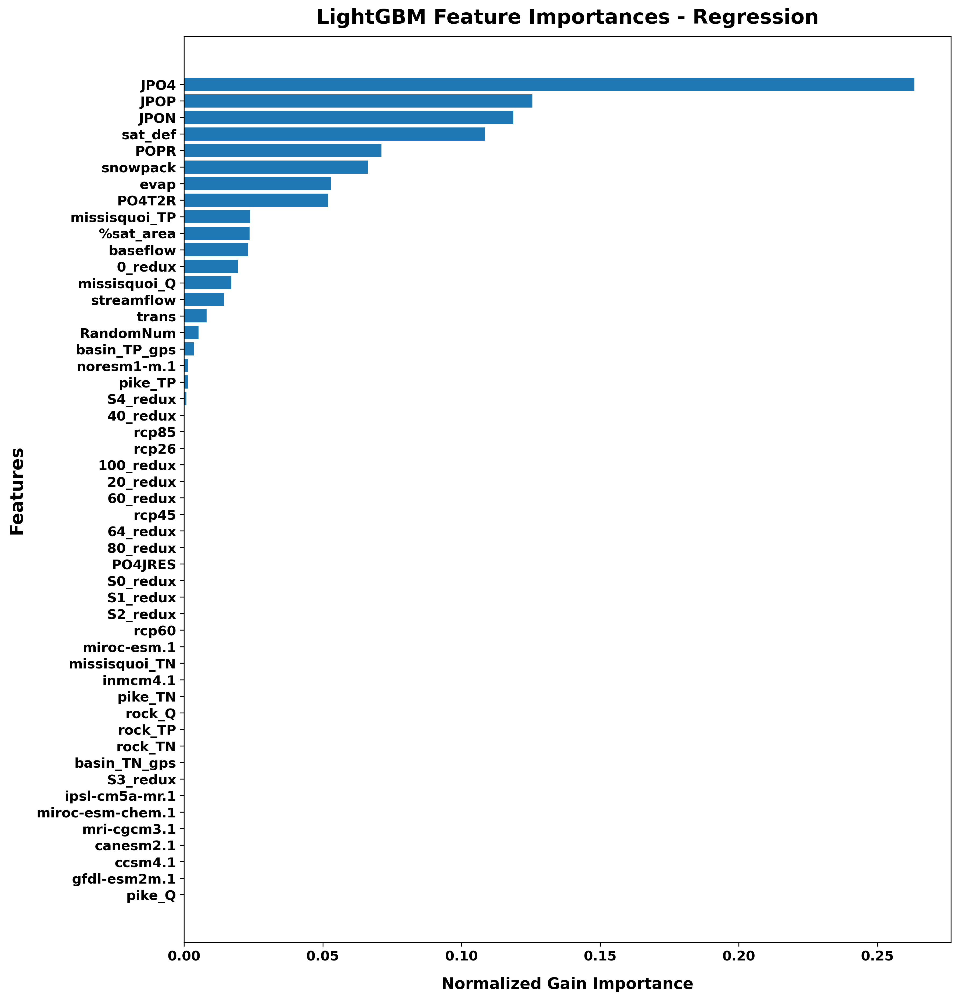

In [29]:

# LightGBM Regression Feaure Importance Plot
# load the model
lgbm_reg_loaded = joblib.load(lgbm_reg_model_path)

booster = getattr(lgbm_reg_loaded, "booster_", lgbm_reg_loaded)
feat_names = booster.feature_name()

imp_gain = booster.feature_importance(importance_type="gain").astype(float)
imp_gain = imp_gain / (imp_gain.sum() + 1e-12)

lgbm_reg_imp_df = (
    pd.DataFrame(
        {
            "feature": feat_names,
            "gain": imp_gain
        }
    ).set_index("feature").reindex(X_regression_test.columns).fillna(0.0).sort_values("gain", ascending=True)
    )

display(lgbm_reg_imp_df.sort_values("gain", ascending=False).head(15))

plot_feature_importance_barh(
    imp_df=lgbm_reg_imp_df,
    value_col="gain",
    title="LightGBM Feature Importances - Regression",
    xlabel="Normalized Gain Importance",
    )


#### **6.5 Feature importance in XGBoost**

- XGBoost provides following feature-importance options.
  - **weight**
  - **gain**
  - **cover**
  - **total_gain**
  - **total_cover**
- **Weight:**
  - counts how many times a feature is used for splitting
- **Gain:**
  - average improvement in the objective when the feature is used
- **Cover:**
  - average number of samples affected by splits using the feature
- **Total gain:**
  - total improvement from all splits using the feature
- **Total cover:**
  - total sample coverage from all splits using the feature
- In this notebook, we use:
  **Gain importance**
- Useful links:
  - [XGBoost: Python API feature importance](https://xgboost.readthedocs.io/en/latest/python/python_api.html)
  - [XGBoost: plot_importance](https://xgboost.readthedocs.io/en/latest/python/python_api.html#xgboost.plot_importance)

,mean
snowpack,0.228467
JPO4,0.099919
%sat_area,0.067816
sat_def,0.053729
POPR,0.045542
baseflow,0.045174
JPON,0.039613
missisquoi_Q,0.033727
JPOP,0.032965
PO4T2R,0.030230


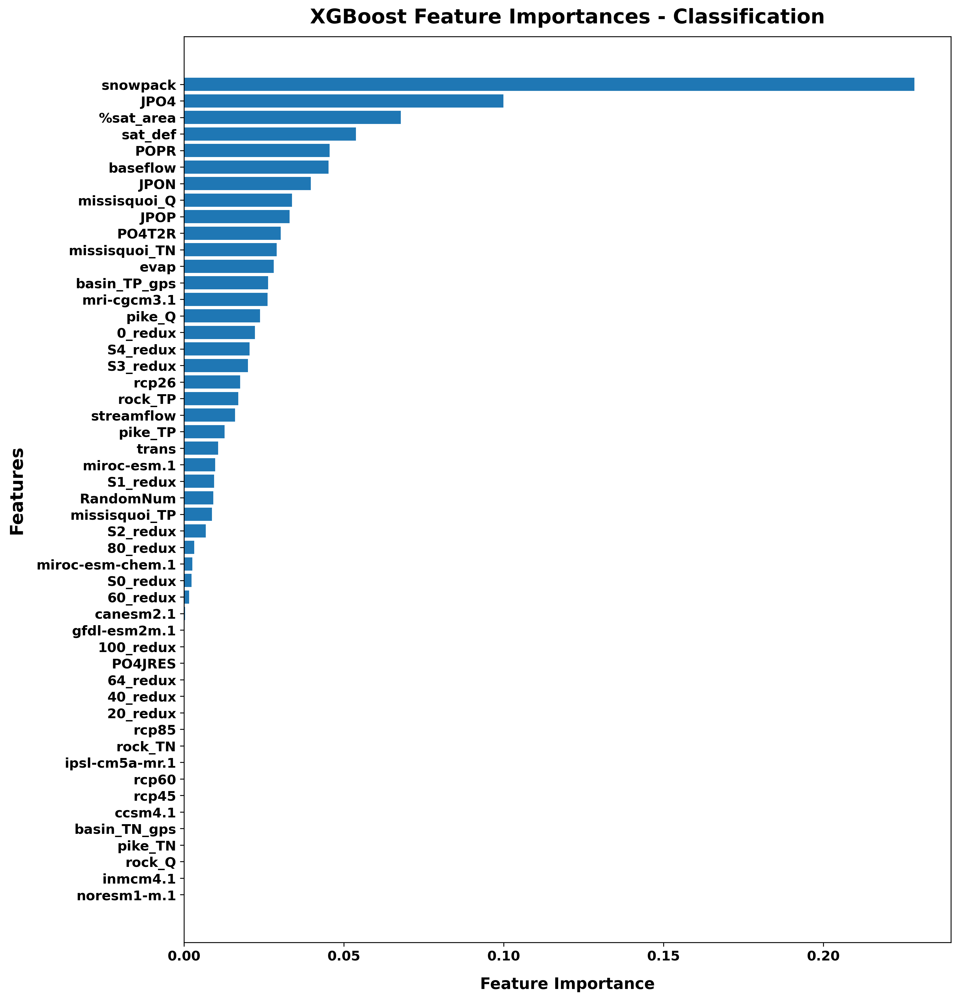

In [30]:

# XGBoost Classification Feature Importance Plot
# load the model
xgb_clf_loaded = joblib.load(xgb_class_model_path)
imp_mean = xgb_clf_loaded.feature_importances_

xgb_clf_imp_df = (
    pd.DataFrame(
        {
            "mean": imp_mean
        },
        index=X_classification_test.columns).sort_values("mean", ascending=True)
    )

display(xgb_clf_imp_df.sort_values("mean", ascending=False).head(15))

plot_feature_importance_barh(
    imp_df=xgb_clf_imp_df,
    value_col="mean",
    title="XGBoost Feature Importances - Classification",
    xlabel="Feature Importance",
    )


,mean
JPO4,0.147118
sat_def,0.087753
missisquoi_Q,0.086773
baseflow,0.086236
JPOP,0.084252
%sat_area,0.072701
snowpack,0.063158
JPON,0.061158
0_redux,0.056476
evap,0.050834


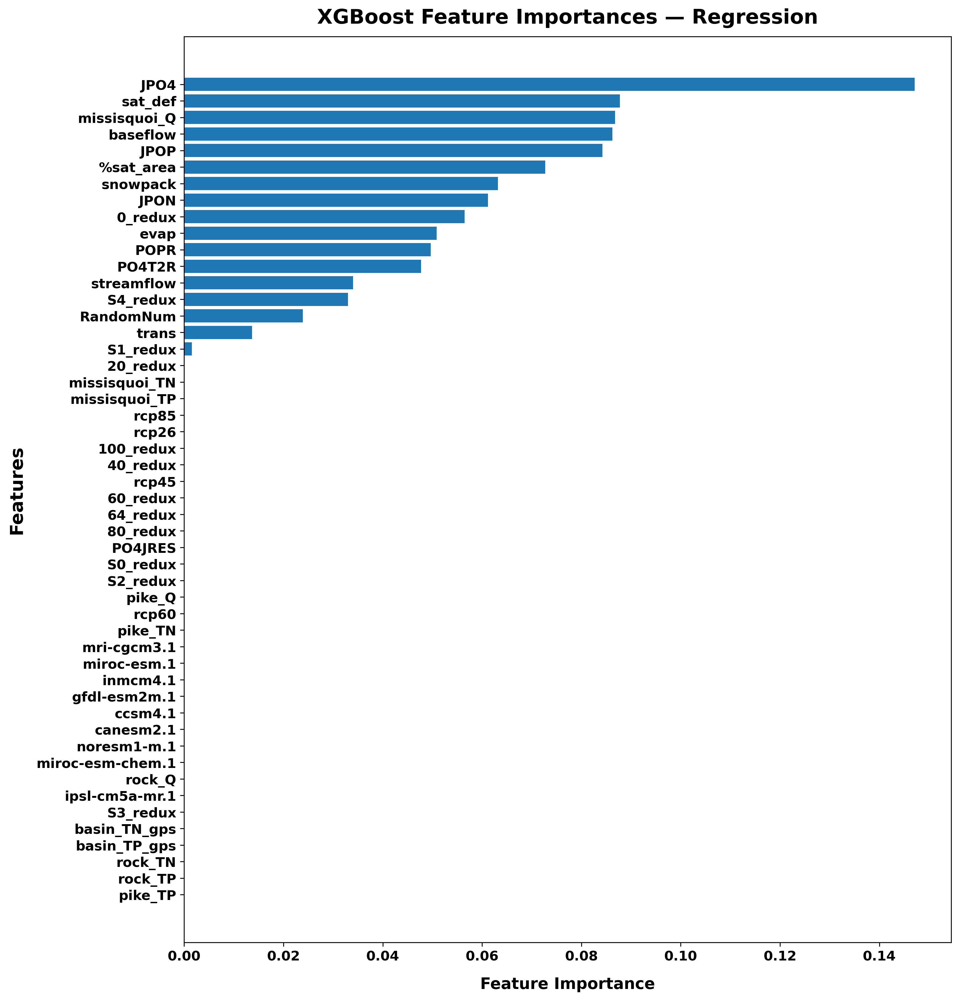

In [31]:

# XGBoost Regression Feature Importance Plot
# load the model
xgb_reg_loaded = joblib.load(xgb_reg_model_path)

imp_mean = xgb_reg_loaded.feature_importances_

xgb_reg_imp_df = (
    pd.DataFrame(
        {
            "mean": imp_mean
        },
        index=X_regression_test.columns
    ).sort_values("mean", ascending=True)
    )

display(xgb_reg_imp_df.sort_values("mean", ascending=False).head(15))

plot_feature_importance_barh(
    imp_df=xgb_reg_imp_df,
    value_col="mean",
    title="XGBoost Feature Importances — Regression",
    xlabel="Feature Importance",
    )


### **7. Partial Dependence Plots (PDPs)**
    
#### **7.1 What are Partial Dependence Plots (PDPs)?**
- Feature importance tells us:
  **Which variables were important to the model**
- But feature importance does **not** tell us:
  - whether the relationship is positive or negative
  - how the prediction changes as a feature changes
  - whether the effect is linear, nonlinear, threshold-based, or saturating
- Example:
  A feature may have very high importance, but:
  - does increasing it increase chlorophyll-a?
  - does it decrease chlorophyll-a?
  - does it increase only after some threshold?
  - does the response saturate after some point?
- PDPs help answer these questions.
#### **7.2 Main idea of PDPs**
- A Partial Dependence Plot shows:
  **How model predictions change as one feature changes while averaging over the remaining features**
- **General intuition:**
    - Vary one feature
    - Keep other features from the dataset
    - Average predictions
    - Observe the response trend
- **PDPs help us visualize:**
    - Direction of effect
    - Magnitude of effect
    - Nonlinear behavior
    - Potential regime shifts
- **How PDPs will be used in this workshop:**
    - PDPs help interpret emulator behavior.
    - We will connect PDPs with:
        - Teleconnection discovery
        - Environmental interpretation
        - Policy interpretation
        - Sensitivity analysis

`NOTE: PDPs visualize model behavior, not True causality.`

#### **7.3 Bootstrapping for PDPs**
` PDPs help us visualize how model predictions change as a feature changes. `
There exist a limitation:
`a single PDP curve may depend heavily on one particular sampled dataset`
If we compute PDP only once:
- We may overinterpret the signal
- We may assume the learned relationship is stronger
- The curve may reflect sampling noise or scenario-specific patterns
  
Bootstrapping address above limitation. Main Idea:
- Repeatedly resample the dataset
- Recompute the PDP many times
- Compare the resulting curves
  
Instead of trusting one PDP curve:
- We generate multiple PDP curves
- Each uses a different resampled version of data
  
This evaluate:
- Stability
- Consistency
- Uncertainty in the learned response


In [32]:

# a few helper functions
def get_top_features(imp_df, score_col, top_k=6):
    return (
        imp_df.sort_values(score_col, ascending=False)
        .head(top_k)
        .index
        .tolist()
    )


def make_pdp_sample(X_train, subsample_n=500, random_state=14912, replace=False):
    rng = np.random.default_rng(random_state)
    idx = rng.choice(
        X_train.index,
        size=min(subsample_n, len(X_train)),
        replace=replace
    )

    X_small = X_train.loc[idx].copy()

    int_cols = X_small.select_dtypes(include=["int", "int64", "int32"]).columns
    X_small[int_cols] = X_small[int_cols].astype(float)

    return X_small

    
def set_single_thread(model):
    try:
        model.set_params(n_jobs=1)
    except Exception:
        if hasattr(model, "n_jobs"):
            model.n_jobs = 1

    # Lets turn off model-level verbose output
    try:
        model.set_params(verbose=0)
    except Exception:
        if hasattr(model, "verbose"):
            model.verbose = 0

def plot_simple_pdps(
    model,
    X_train,
    features,
    title,
    is_classification=False,
    class_id=None,
    subsample_n=500,
    grid_resolution=30,
    random_state=14912,
    n_jobs=4
    ):
    start_time = time.time()

    X_small = make_pdp_sample(
        X_train,
        subsample_n=subsample_n,
        random_state=random_state,
        replace=False
    )

    features = [f for f in features if f in X_small.columns]
    set_single_thread(model)

    n_rows, n_cols = 3, 2

    fig, axs = plt.subplots(n_rows, n_cols, figsize=(14, 8), dpi=100)
    axs = np.atleast_2d(axs)

    pdp_kwargs = dict(
        estimator=model,
        X=X_small,
        features=features,
        n_jobs=n_jobs,
        grid_resolution=grid_resolution,
        verbose=0,
        ax=axs
    )

    if is_classification:
        pdp_kwargs["target"] = class_id

    with parallel_backend("threading", n_jobs=n_jobs):
        PartialDependenceDisplay.from_estimator(**pdp_kwargs)

    fig.suptitle(title, fontsize=18, fontweight="bold")

    for i, ax in enumerate(axs.flat):
        if i >= len(features):
            ax.axis("off")
            continue

        for ln in ax.lines:
            ln.set_linewidth(3.0)

        ax.set_title(ax.get_title(), fontsize=14, fontweight="bold")
        ax.set_xlabel(features[i], fontsize=14, fontweight="bold")
        ax.set_ylabel("Partial Dependence" if i % n_cols == 0 else "", fontsize=14, fontweight="bold")

        for t in ax.get_xticklabels() + ax.get_yticklabels():
            t.set_fontsize(11)
            t.set_fontweight("bold")

    fig.subplots_adjust(
        left=0.08,
        right=0.98,
        top=0.88,
        bottom=0.08,
        wspace=0.18,
        hspace=0.45
    )

    # fig.savefig(out_path, dpi=500, bbox_inches="tight")
    plt.show()

    elapsed = time.time() - start_time
    print(f"Simple PDP time: {elapsed:.2f} seconds")

    return elapsed

def compute_one_feature_pdp(
    model,
    X_sample,
    feature,
    grid_resolution=20,
    is_classification=False,
    class_id=None
    ):
    result = partial_dependence(
        estimator=model,
        X=X_sample,
        features=[feature],
        grid_resolution=grid_resolution,
        kind="average"
    )

    grid_values = result["grid_values"][0]
    average = result["average"]

    # Regression: shape [1, grid_points]
    if not is_classification:
        pdp_values = average[0]

    # Multiclass classification: shape [n_classes, grid_points]
    else:
        pdp_values = average[class_id]

    return grid_values, pdp_values

def plot_bootstrap_pdps(
    model,
    X_train,
    features,
    title,
    is_classification=False,
    class_id=None,
    n_bootstrap=10,
    subsample_n=100,
    grid_resolution=20,
    random_state=14912
    ):
    start_time = time.time()
    features = [f for f in features if f in X_train.columns]
    set_single_thread(model)
    rng = np.random.default_rng(random_state)
    n_rows, n_cols = 3, 2
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(14, 8), dpi=150)
    axs = np.atleast_2d(axs)

    for i, feature in enumerate(features):
        ax = axs.flat[i]
        all_curves = []
        grid_ref = None
        feature_start = time.time()

        for b in range(n_bootstrap):
            boot_seed = int(rng.integers(0, 1_000_000))
            X_boot = make_pdp_sample(
                X_train,
                subsample_n=subsample_n,
                random_state=boot_seed,
                replace=True
            )
            grid_values, pdp_values = compute_one_feature_pdp(
                model=model,
                X_sample=X_boot,
                feature=feature,
                grid_resolution=grid_resolution,
                is_classification=is_classification,
                class_id=class_id
            )
            if grid_ref is None:
                grid_ref = grid_values
            if len(grid_values) != len(grid_ref) or not np.allclose(grid_values, grid_ref):
                pdp_values = np.interp(grid_ref, grid_values, pdp_values)
            all_curves.append(pdp_values)
            ax.plot(grid_ref, pdp_values, alpha=0.25, linewidth=1.2, color="steelblue")

        all_curves = np.asarray(all_curves)

        # Lets have summary statistics and draw those too
        mean_curve   = np.mean(all_curves, axis=0)
        median_curve = np.median(all_curves, axis=0)
        q25_curve    = np.percentile(all_curves, 25, axis=0)
        q75_curve    = np.percentile(all_curves, 75, axis=0)
        lower_90     = np.percentile(all_curves, 5,  axis=0)
        upper_90     = np.percentile(all_curves, 95, axis=0)

        # 90% CI band 
        ax.fill_between(
            grid_ref, lower_90, upper_90,
            alpha=0.15, color="steelblue",
            label="90% CI"
        )
        # IQR band (Q25 - Q75)
        ax.fill_between(
            grid_ref, q25_curve, q75_curve,
            alpha=0.30, color="darkorange",
            label="IQR (Q25-Q75)"
            )
        # mean PDP
        line_mean, = ax.plot(
            grid_ref, mean_curve,
            linewidth=2.5, color="steelblue",
            label="Mean PDP"
            )
        # median PDP
        line_median, = ax.plot(
            grid_ref, median_curve,
            linewidth=2.0, color="darkorange",
            linestyle="--",
            label="Median PDP"
            )

        feature_elapsed = time.time() - feature_start
        print(f"{feature}: bootstrap PDP finished in {feature_elapsed:.2f} seconds")

        ax.set_title(feature, fontsize=14, fontweight="bold")
        ax.set_xlabel(feature, fontsize=14, fontweight="bold")
        ax.set_ylabel("Partial Dependence" if i % n_cols == 0 else "", fontsize=14, fontweight="bold")
        for t in ax.get_xticklabels() + ax.get_yticklabels():
            t.set_fontsize(11)
            t.set_fontweight("bold")

    for j in range(len(features), n_rows * n_cols):
        axs.flat[j].axis("off")

    fig.suptitle(title, fontsize=18, fontweight="bold")
    fig.subplots_adjust(
        left=0.08,
        right=0.98,
        top=0.88,
        bottom=0.08,
        wspace=0.18,
        hspace=0.45
        )

    # we will have shared legend: top-center, ncols=3, no fancybox, no shadow
    handles, labels = axs.flat[0].get_legend_handles_labels()
    fig.legend(
        handles, labels,
        loc="upper center",
        bbox_to_anchor=(0.5, 0.96),
        ncol=4,
        prop={"size": 11, "weight": "bold"},
        fancybox=False,
        shadow=False,
        frameon=True
        )

    # fig.savefig(out_path, dpi=500, bbox_inches="tight")
    plt.show()
    elapsed = time.time() - start_time
    print(f"Bootstrap PDP total time: {elapsed:.2f} seconds")
    return elapsed

## 

#### **7.4 Random Forest PDPs**

##### **7.4.1 Random Forest Classification PDP**

RF Classification Top 6: ['snowpack', 'JPO4', 'JPOP', 'JPON', 'sat_def', 'evap']


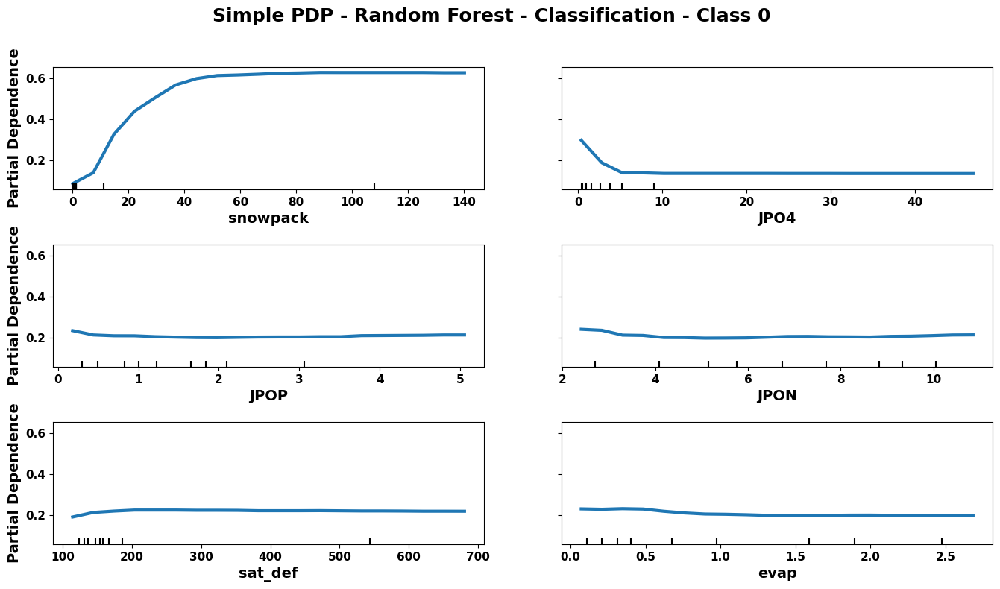

Simple PDP time: 1.92 seconds


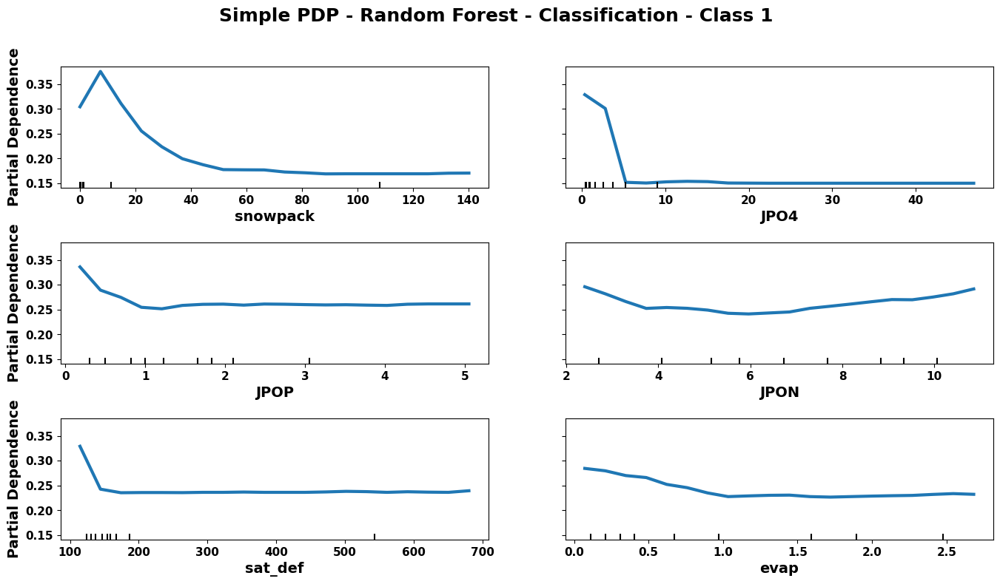

Simple PDP time: 1.72 seconds


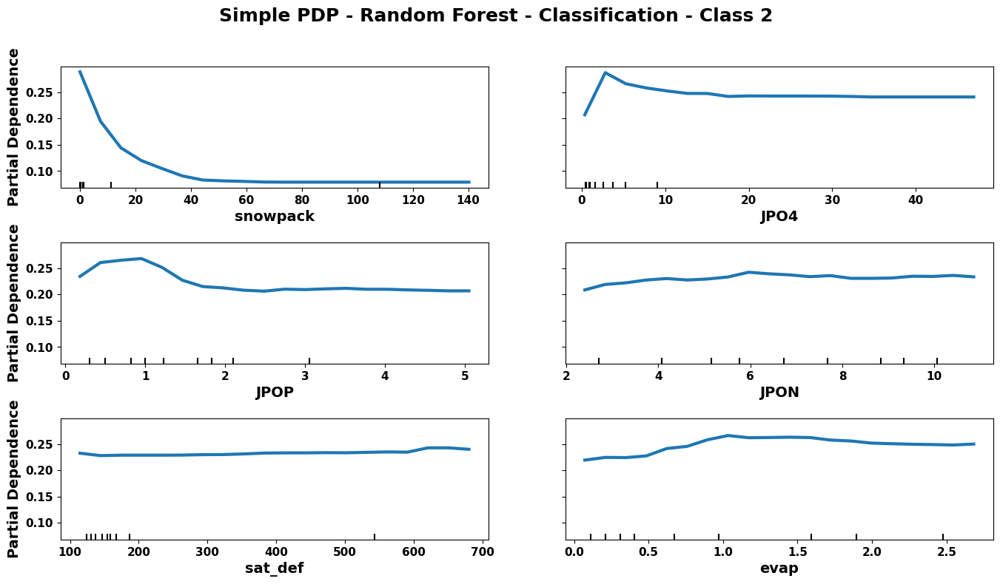

Simple PDP time: 1.72 seconds


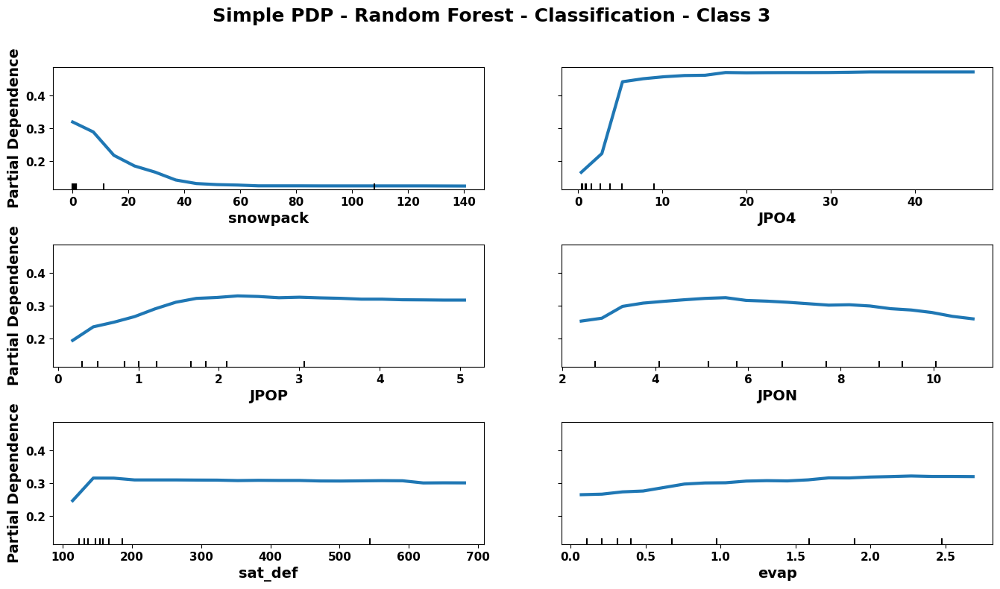

Simple PDP time: 1.80 seconds

Total RF classification simple PDP time: 7.15 seconds


In [33]:

# get the top 6 variables
rf_clf_top6 = get_top_features(
    rf_clf_imp_df,
    score_col="mean",
    top_k=6
    )

print("RF Classification Top 6:", rf_clf_top6)

# call the function to plot the PDPs
rf_clf_simple_times = {}

simple_start = time.time()

for class_id in range(4):
    rf_clf_simple_times[class_id] = plot_simple_pdps(
        model=rf_clf_loaded,
        X_train=X_class_train,
        features=rf_clf_top6,
        title=f"Simple PDP - Random Forest - Classification - Class {class_id}",
        is_classification=True,
        class_id=class_id,
        subsample_n=50,
        grid_resolution=20,
        n_jobs=4
        )

rf_clf_simple_total_time = time.time() - simple_start

print(f"\nTotal RF classification simple PDP time: {rf_clf_simple_total_time:.2f} seconds")


snowpack: bootstrap PDP finished in 1.55 seconds
JPO4: bootstrap PDP finished in 1.57 seconds
JPOP: bootstrap PDP finished in 1.57 seconds
JPON: bootstrap PDP finished in 1.56 seconds
sat_def: bootstrap PDP finished in 1.55 seconds
evap: bootstrap PDP finished in 1.56 seconds


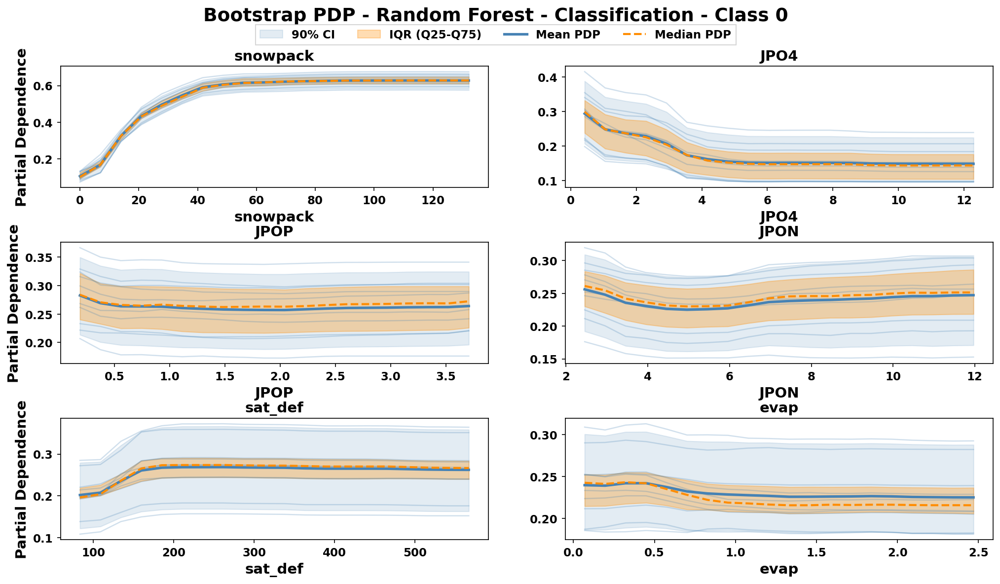

Bootstrap PDP total time: 10.02 seconds
snowpack: bootstrap PDP finished in 1.52 seconds
JPO4: bootstrap PDP finished in 1.56 seconds
JPOP: bootstrap PDP finished in 1.59 seconds
JPON: bootstrap PDP finished in 1.60 seconds
sat_def: bootstrap PDP finished in 1.59 seconds
evap: bootstrap PDP finished in 1.66 seconds


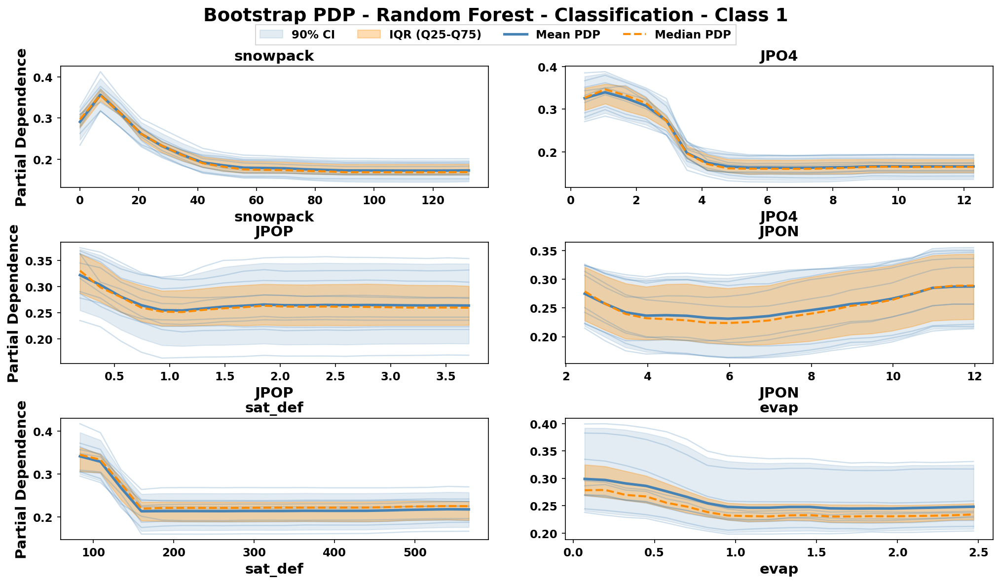

Bootstrap PDP total time: 10.20 seconds
snowpack: bootstrap PDP finished in 1.52 seconds
JPO4: bootstrap PDP finished in 1.59 seconds
JPOP: bootstrap PDP finished in 1.57 seconds
JPON: bootstrap PDP finished in 1.63 seconds
sat_def: bootstrap PDP finished in 1.58 seconds
evap: bootstrap PDP finished in 1.59 seconds


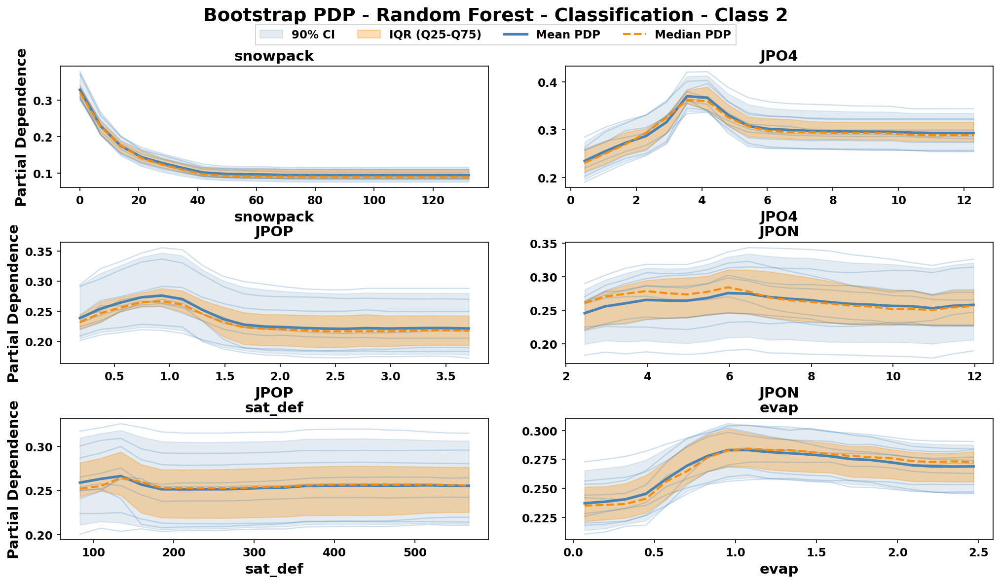

Bootstrap PDP total time: 10.28 seconds
snowpack: bootstrap PDP finished in 1.52 seconds
JPO4: bootstrap PDP finished in 1.55 seconds
JPOP: bootstrap PDP finished in 1.55 seconds
JPON: bootstrap PDP finished in 1.57 seconds
sat_def: bootstrap PDP finished in 1.57 seconds
evap: bootstrap PDP finished in 1.57 seconds


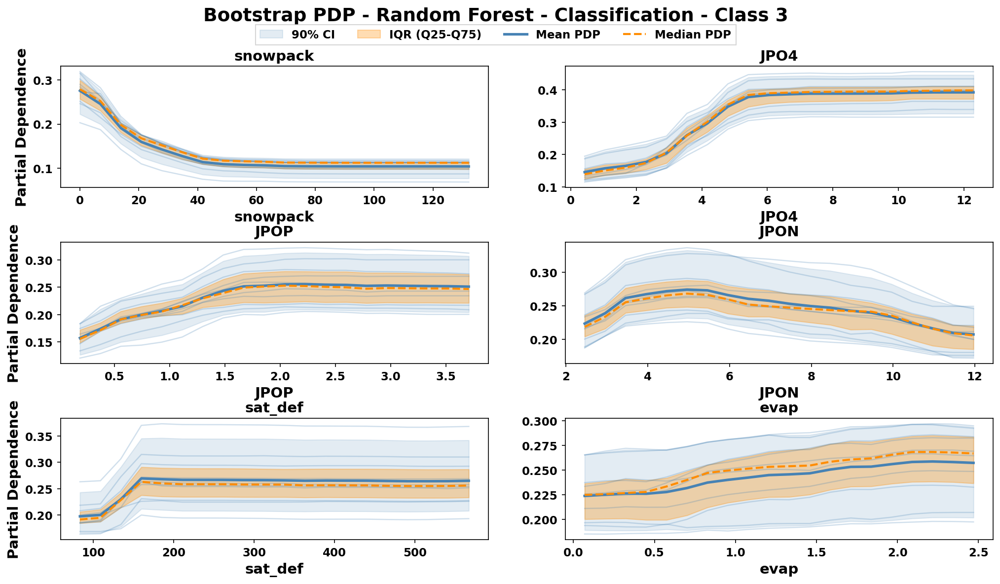

Bootstrap PDP total time: 9.98 seconds

Total RF classification bootstrap PDP time: 40.48 seconds


In [34]:

rf_clf_bootstrap_times = {}
bootstrap_start = time.time()

for class_id in range(4):
    rf_clf_bootstrap_times[class_id] = plot_bootstrap_pdps(
        model=rf_clf_loaded,
        X_train=X_class_train,
        features=rf_clf_top6,
        title=f"Bootstrap PDP - Random Forest - Classification - Class {class_id}",
        is_classification=True,
        class_id=class_id,
        n_bootstrap=10,
        subsample_n=50,
        grid_resolution=20
        )

rf_clf_bootstrap_total_time = time.time() - bootstrap_start
print(f"\nTotal RF classification bootstrap PDP time: {rf_clf_bootstrap_total_time:.2f} seconds")


### **How to Interpret Bootstrap/Simple PDPs** 

`Reading PDP Plots:`
- **Mean PDP:** average partial-dependence curve across bootstrap resamples.
- **Median PDP:** middle PDP curve across bootstrap resamples, less sensitive to extreme bootstrap runs.
- **IQR (Q25-Q75):** middle 50% of bootstrap PDP curves, shows typical variability.
- **90% CI:** wider uncertainty band, shows how stable or unstable the PDP pattern is across resampled data.
Simple PDP vs Bootstrap PDP:
    - Simple PDP shows one fitted-model interpretation from one dataset sample.
    - Bootstrap PDP shows whether that pattern is stable under resampling.
    - If mean/median curves agree and bands are narrow, the relationship is more stable.

`Random Forest Classification PDPs Interpretation:`

- **JPO4 shows the clear separation:** higher JPO4 generally shifts probability away from lower classes and toward higher trophic-state classes.
- **Snowpack shows the opposite pattern:** higher snowpack tends to support lower classes, while reducing the probability of higher classes.
- **sat_def generally supports higher-class behavior,** especially after an initial threshold-like increase, suggesting sensitivity to moisture or deficit-related conditions.
- **evap, JPON, and JPOP** show more non-linear and class-dependent effects, so they can be considered as secondary predictors rather than simple monotonic drivers.
- **Simple PDPs show the main average trend**, while **bootstrap PDPs show how stable that trend is under resampling**.
- When the **mean and median PDPs are close** and the **IQR and 90% CI bands are narrow**, the relationship is more stable.
- These patterns indicate predictive associations learned by the Random Forest emulator, not direct causal effects in the real world.

    

##### **7.4.2 Random Forest Regression**

RF Regression Top 6: ['JPO4', 'POPR', 'sat_def', 'JPON', 'JPOP', 'PO4T2R']


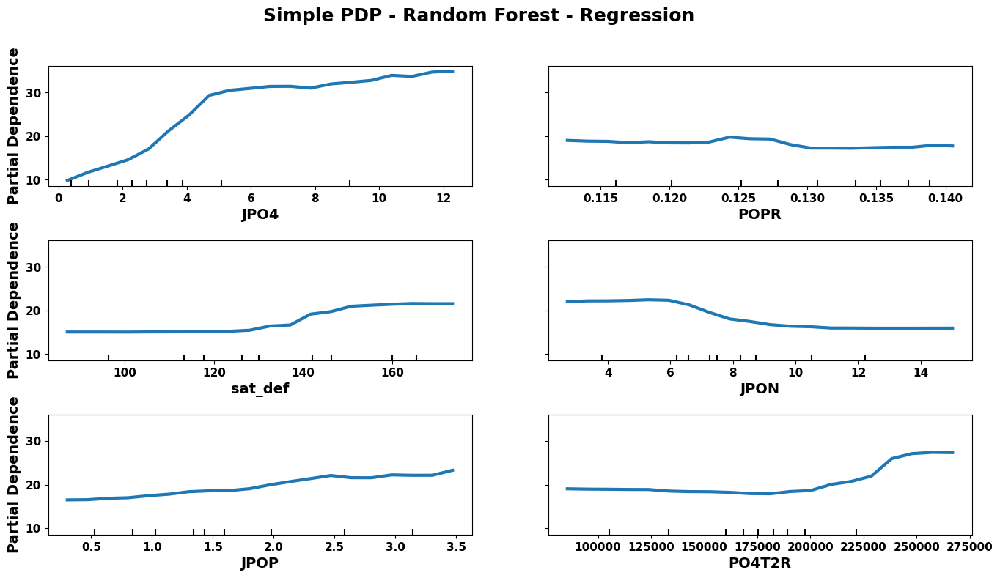

Simple PDP time: 0.54 seconds

Total RF regression simple PDP time: 0.54 seconds


In [35]:

rf_reg_top6 = get_top_features(rf_reg_imp_df, score_col="mean", top_k=6)
print("RF Regression Top 6:", rf_reg_top6)

rf_reg_loaded.set_params(verbose=0)

# simple PDP
rf_reg_simple_start = time.time()

rf_reg_simple_time = plot_simple_pdps(
    model=rf_reg_loaded,
    X_train=X_reg_train,
    features=rf_reg_top6,
    title="Simple PDP - Random Forest - Regression",
    is_classification=False,
    subsample_n=50,
    grid_resolution=20,
    n_jobs=4
    )

rf_reg_simple_total_time = time.time() - rf_reg_simple_start
print(f"\nTotal RF regression simple PDP time: {rf_reg_simple_total_time:.2f} seconds")


JPO4: bootstrap PDP finished in 0.13 seconds
POPR: bootstrap PDP finished in 0.21 seconds
sat_def: bootstrap PDP finished in 0.22 seconds
JPON: bootstrap PDP finished in 0.34 seconds
JPOP: bootstrap PDP finished in 0.24 seconds
PO4T2R: bootstrap PDP finished in 0.24 seconds


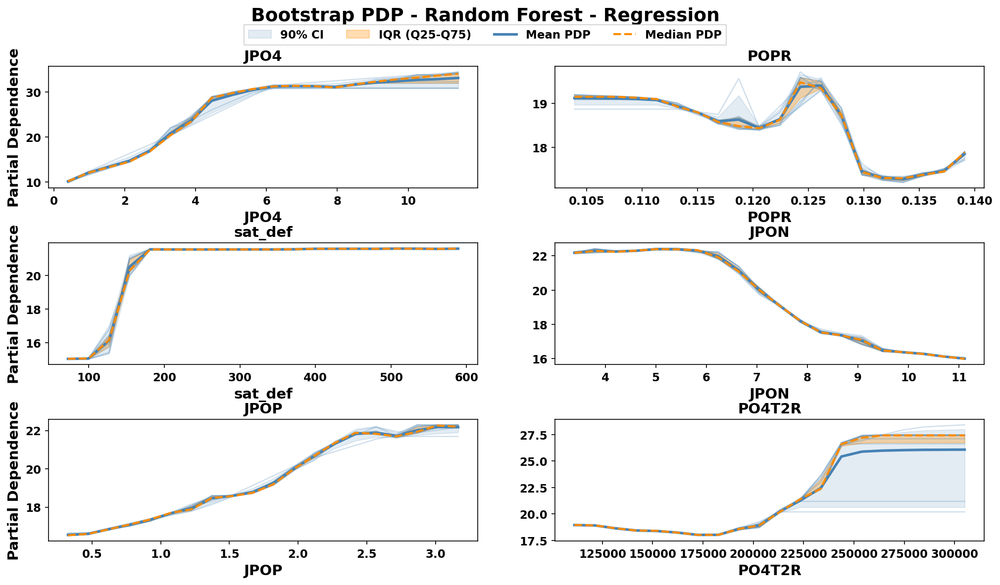

Bootstrap PDP total time: 2.04 seconds

Total RF regression bootstrap PDP time: 2.04 seconds


In [36]:

# bootstrap PDP
rf_reg_bootstrap_start = time.time()

rf_reg_bootstrap_time = plot_bootstrap_pdps(
    model=rf_reg_loaded,
    X_train=X_reg_train,
    features=rf_reg_top6,
    title="Bootstrap PDP - Random Forest - Regression",
    is_classification=False,
    n_bootstrap=10,
    subsample_n=50,
    grid_resolution=20
    )

rf_reg_bootstrap_total_time = time.time() - rf_reg_bootstrap_start
print(f"\nTotal RF regression bootstrap PDP time: {rf_reg_bootstrap_total_time:.2f} seconds")


`Random Forest Regression PDPs Interpretation:`
- **JPO4 shows the positive effect:** higher JPO4 is associated with a clear increase in the predicted continuous response.
- **sat_def shows a positive threshold like effect:** predictions rise sharply after a certain range and then plateau.
- **JPOP has a steady positive relationship**, suggesting that higher particulate phosphorus is associated with higher predicted response values.
- **JPON shows a negative relationship:** higher JPON is associated with lower predicted response values.
- **PO4T2R shows a non linear response:** predictions remain relatively stable at lower values, then increase sharply at higher values.
- **POPR has a weaker and kind of irregular pattern,** so its interpretation should be more cautious.
- **Bootstrap PDPs largely confirm the main simple-PDP trends,** especially for JPO4, sat_def, JPOP, and JPON.
- Narrow bands indicate stable effects for several variables, while wider bands around some ranges, especially PO4T2R and POPR, suggest uncertainty.
- `These patterns reflect predictive relationships learned by the Random Forest emulator, not direct causal effects.`



#### **7.5 LightGBM PDPs**

##### **7.5.1 LightGBM Classification PDP**

LightGBM Classification Top 6: ['snowpack', 'JPO4', 'POPR', 'JPON', 'JPOP', 'sat_def']


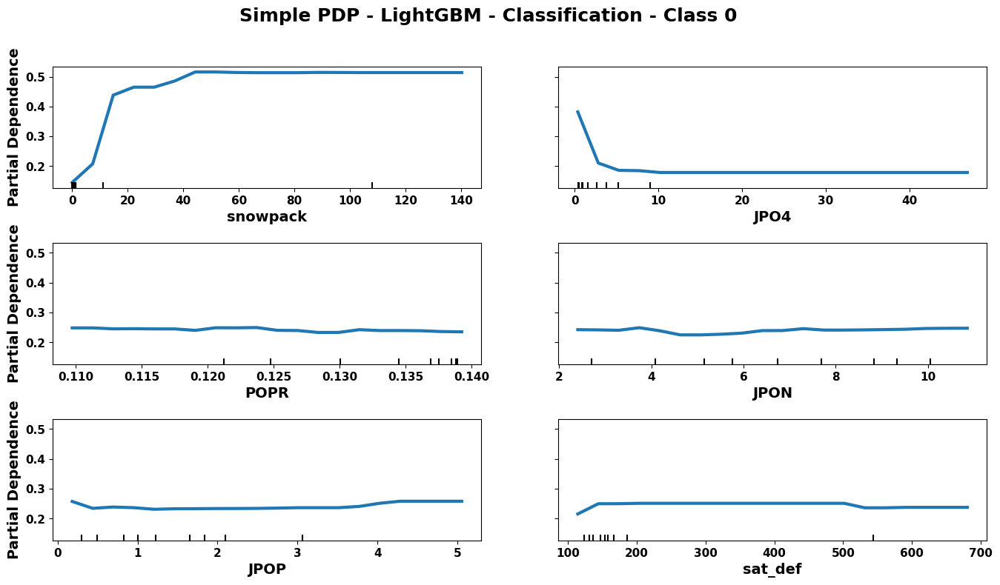

Simple PDP time: 0.65 seconds


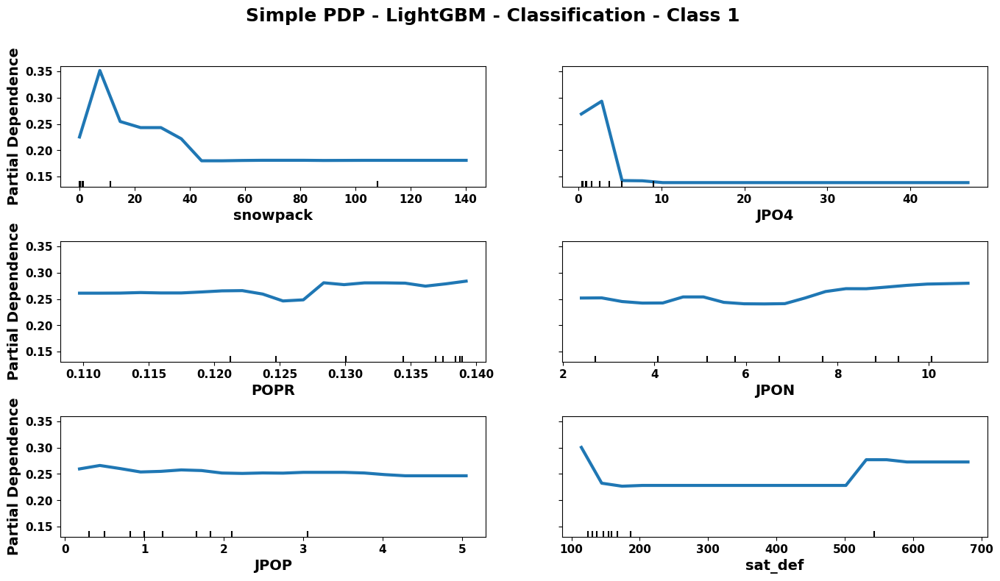

Simple PDP time: 0.70 seconds


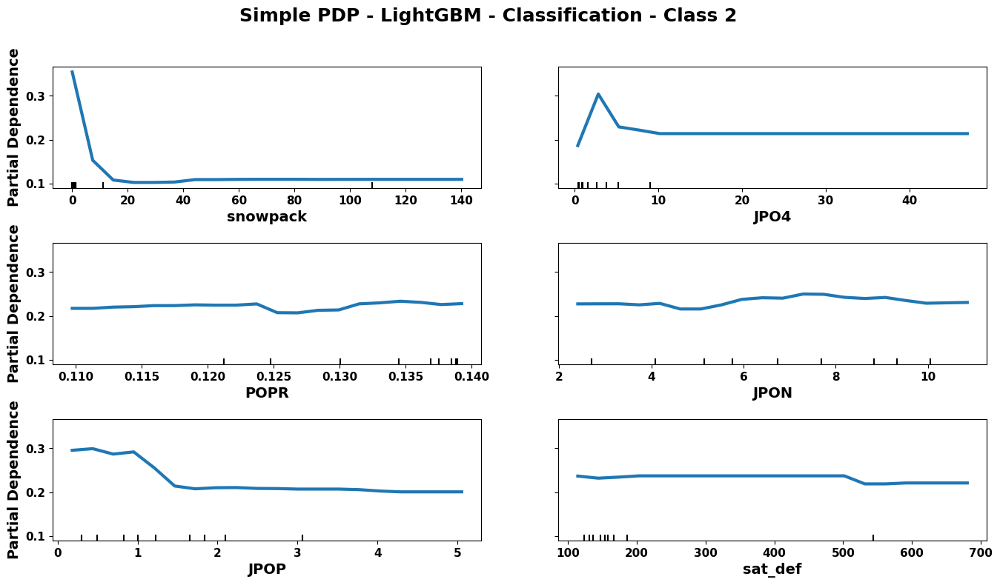

Simple PDP time: 0.64 seconds


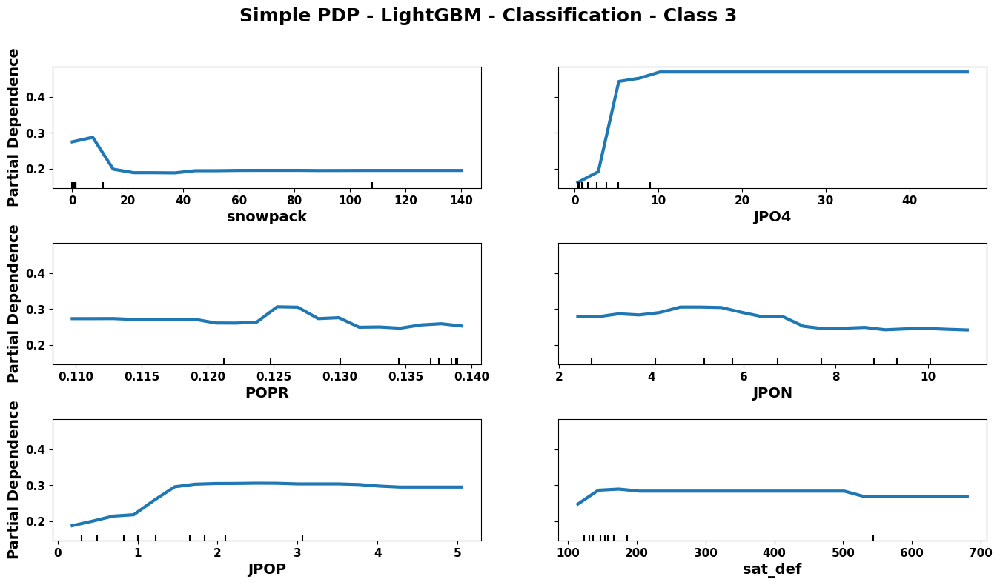

Simple PDP time: 0.67 seconds

Total LightGBM classification simple PDP time: 2.66 seconds


In [37]:

lgbm_clf_top6 = get_top_features(lgbm_clf_imp_df, score_col="gain", top_k=6)
print("LightGBM Classification Top 6:", lgbm_clf_top6)

# simple PDPs
lgbm_clf_simple_times = {}
lgbm_clf_simple_start = time.time()

for class_id in range(4):
    lgbm_clf_simple_times[class_id] = plot_simple_pdps(
        model=lgbm_clf_loaded,
        X_train=X_class_train,
        features=lgbm_clf_top6,
        title=f"Simple PDP - LightGBM - Classification - Class {class_id}",
        is_classification=True,
        class_id=class_id,
        subsample_n=50,
        grid_resolution=20,
        n_jobs=4
        )

lgbm_clf_simple_total_time = time.time() - lgbm_clf_simple_start
print(f"\nTotal LightGBM classification simple PDP time: {lgbm_clf_simple_total_time:.2f} seconds")


snowpack: bootstrap PDP finished in 0.34 seconds
JPO4: bootstrap PDP finished in 0.33 seconds
POPR: bootstrap PDP finished in 0.33 seconds
JPON: bootstrap PDP finished in 0.33 seconds
JPOP: bootstrap PDP finished in 0.34 seconds
sat_def: bootstrap PDP finished in 0.34 seconds


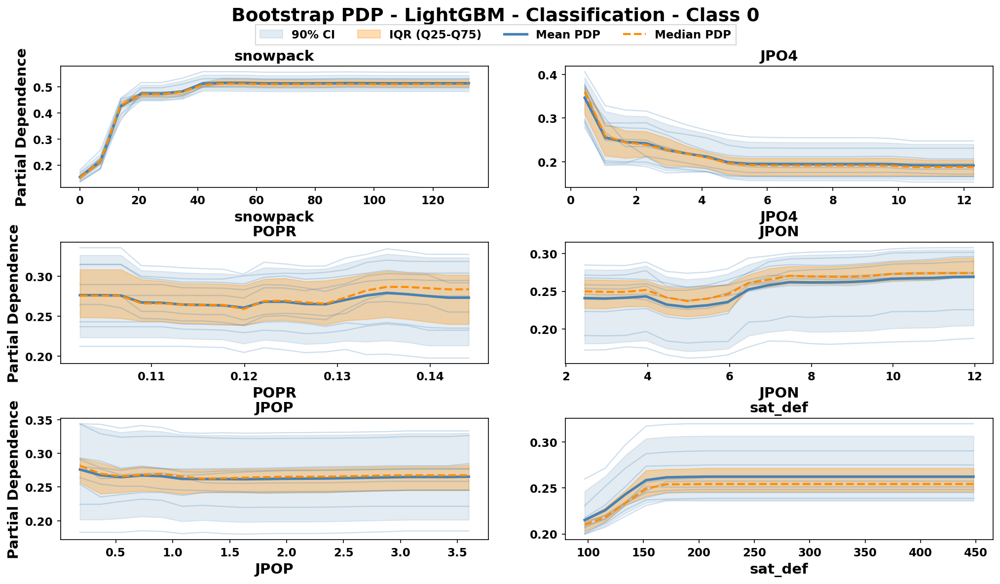

Bootstrap PDP total time: 2.80 seconds
snowpack: bootstrap PDP finished in 0.33 seconds
JPO4: bootstrap PDP finished in 0.33 seconds
POPR: bootstrap PDP finished in 0.33 seconds
JPON: bootstrap PDP finished in 0.33 seconds
JPOP: bootstrap PDP finished in 0.33 seconds
sat_def: bootstrap PDP finished in 0.33 seconds


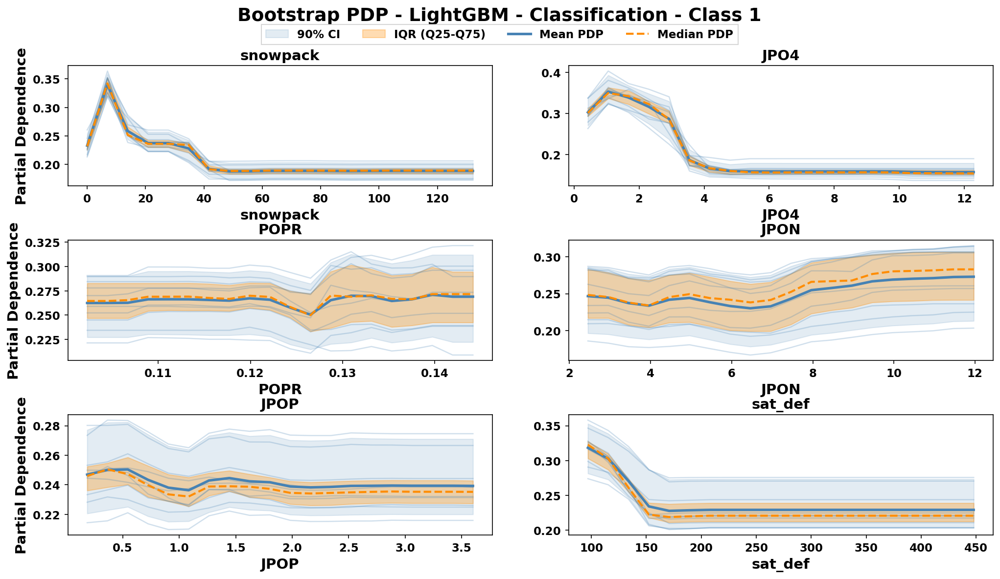

Bootstrap PDP total time: 2.67 seconds
snowpack: bootstrap PDP finished in 0.33 seconds
JPO4: bootstrap PDP finished in 0.33 seconds
POPR: bootstrap PDP finished in 0.34 seconds
JPON: bootstrap PDP finished in 0.34 seconds
JPOP: bootstrap PDP finished in 0.33 seconds
sat_def: bootstrap PDP finished in 0.35 seconds


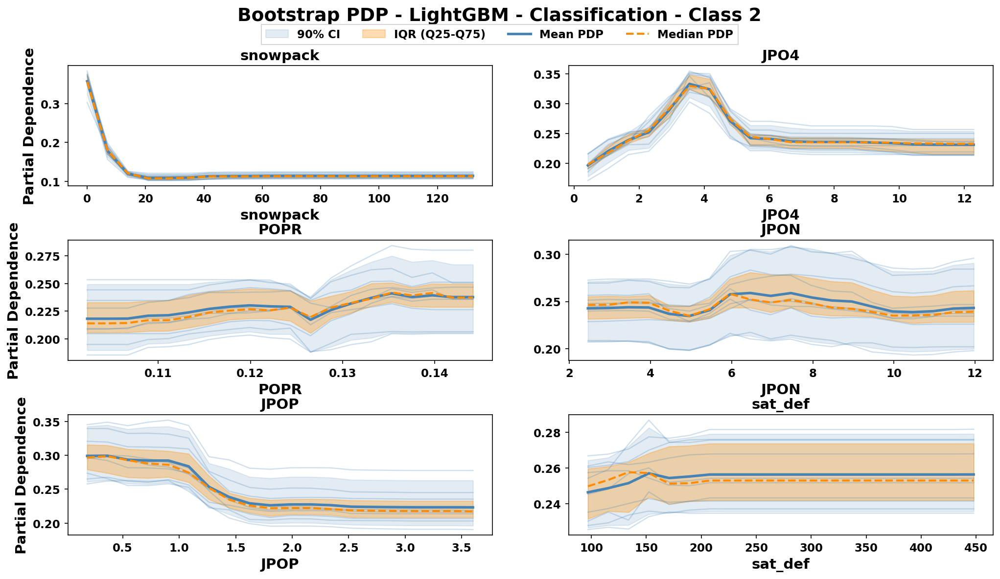

Bootstrap PDP total time: 2.68 seconds
snowpack: bootstrap PDP finished in 0.33 seconds
JPO4: bootstrap PDP finished in 0.33 seconds
POPR: bootstrap PDP finished in 0.33 seconds
JPON: bootstrap PDP finished in 0.34 seconds
JPOP: bootstrap PDP finished in 0.33 seconds
sat_def: bootstrap PDP finished in 0.34 seconds


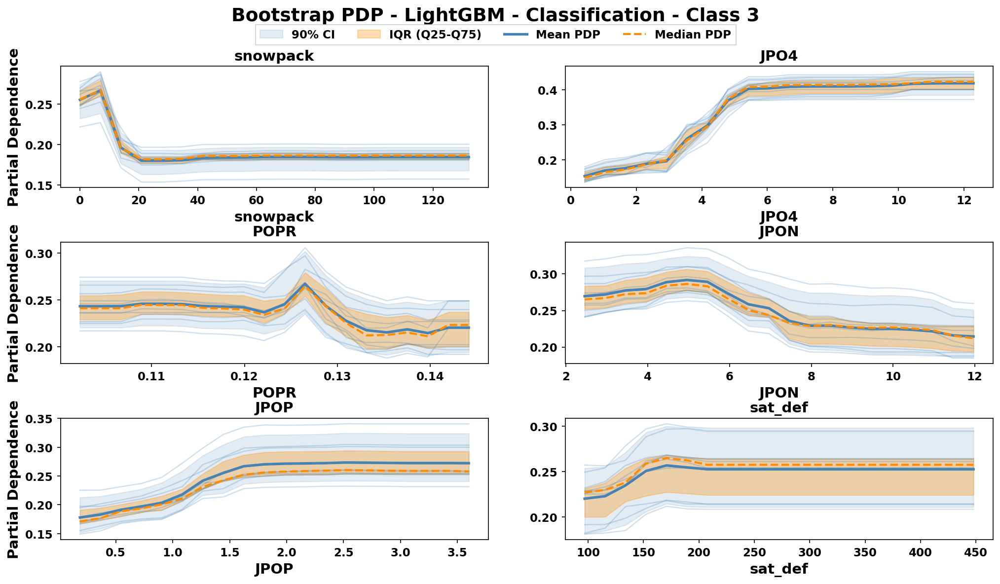

Bootstrap PDP total time: 2.77 seconds

Total LightGBM classification bootstrap PDP time: 10.92 seconds


In [38]:

# bootstrap PDPs
lgbm_clf_bootstrap_times = {}

lgbm_clf_bootstrap_start = time.time()

for class_id in range(4):
    lgbm_clf_bootstrap_times[class_id] = plot_bootstrap_pdps(
        model=lgbm_clf_loaded,
        X_train=X_class_train,
        features=lgbm_clf_top6,
        title=f"Bootstrap PDP - LightGBM - Classification - Class {class_id}",
        is_classification=True,
        class_id=class_id,
        n_bootstrap=10,
        subsample_n=50,
        grid_resolution=20
        )

lgbm_clf_bootstrap_total_time = time.time() - lgbm_clf_bootstrap_start
print(f"\nTotal LightGBM classification bootstrap PDP time: {lgbm_clf_bootstrap_total_time:.2f} seconds")


### **LightGBM Classification PDPs Interpretation**

- **JPO4 remains the separating feature,** similar to Random Forest:
    - Higher JPO4 decreases lower class probabilities while increasing higher class probabilities, especially Classes 2 and 3.
- **Snowpack generally shows the opposite behavior:**
    - Higher snowpack supports lower classes, and reduces higher class probabilities.
- **JPON shows strong class-dependent behavior:**
    - Positive association for Class 1, negative association for Class 2, and weaker/non-linear effects for other classes.
- **JPOP contributes mainly through threshold like behavior,** especially for higher classes where probability increases after moderate values.
- **%sat_area shows non-linear responses:**
    - Relatively weak effects for lower classes, but decreasing trends for higher classes at large values.
- Compared with Random Forest, **LightGBM PDPs appear more piecewise and threshold-oriented,** which is expected from boosted tree splits.
- **Bootstrap PDPs support the same trends observed in the simple PDPs.**
- Several variables show **narrow IQR and CI bands across large ranges,** indicating relatively stable learned relationships.

`As with previous models, these PDPs represent predictive associations learned by the emulator, not direct causal relationships.`

##### **7.5.2 LightGBM Regression PDPs**

LightGBM Regression Top 6: ['JPO4', 'JPOP', 'JPON', 'sat_def', 'POPR', 'snowpack']


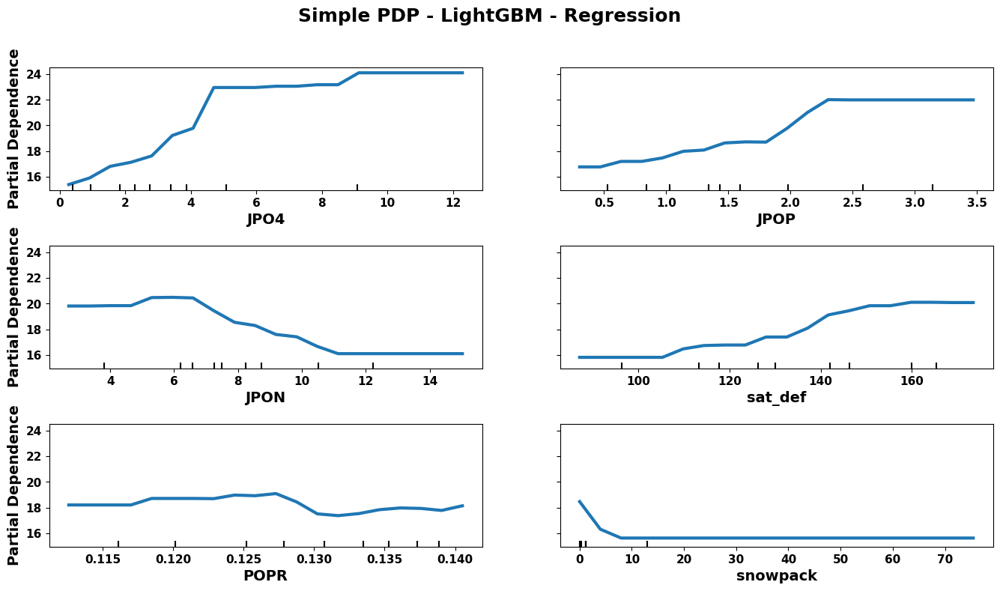

Simple PDP time: 0.68 seconds

Total LightGBM regression simple PDP time: 0.68 seconds


In [39]:

lgbm_reg_top6 = get_top_features(lgbm_reg_imp_df, score_col="gain", top_k=6)
print("LightGBM Regression Top 6:", lgbm_reg_top6)

# simple PDP
lgbm_reg_simple_start = time.time()

lgbm_reg_simple_time = plot_simple_pdps(
    model=lgbm_reg_loaded,
    X_train=X_reg_train,
    features=lgbm_reg_top6,
    title="Simple PDP - LightGBM - Regression",
    is_classification=False,
    subsample_n=50,
    grid_resolution=20,
    n_jobs=4
    )

lgbm_reg_simple_total_time = time.time() - lgbm_reg_simple_start
print(f"\nTotal LightGBM regression simple PDP time: {lgbm_reg_simple_total_time:.2f} seconds")



JPO4: bootstrap PDP finished in 0.28 seconds
JPOP: bootstrap PDP finished in 0.28 seconds
JPON: bootstrap PDP finished in 0.28 seconds
sat_def: bootstrap PDP finished in 0.31 seconds
POPR: bootstrap PDP finished in 0.28 seconds
snowpack: bootstrap PDP finished in 0.28 seconds


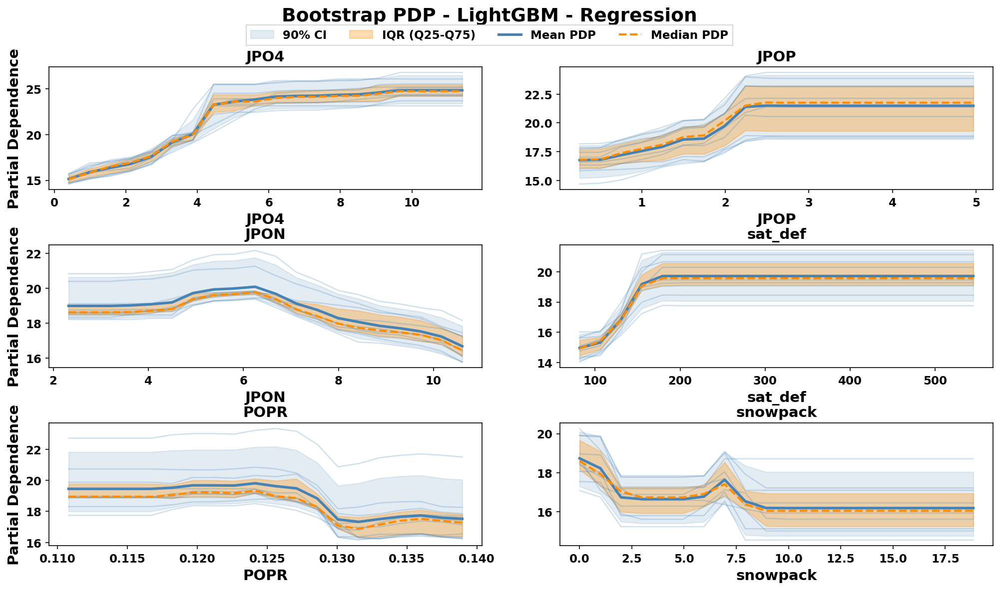

Bootstrap PDP total time: 2.36 seconds

Total LightGBM regression bootstrap PDP time: 2.36 seconds


In [40]:

# bootstrap PDP
lgbm_reg_bootstrap_start = time.time()

lgbm_reg_bootstrap_time = plot_bootstrap_pdps(
    model=lgbm_reg_loaded,
    X_train=X_reg_train,
    features=lgbm_reg_top6,
    title="Bootstrap PDP - LightGBM - Regression",
    is_classification=False,
    n_bootstrap=10,
    subsample_n=50,
    grid_resolution=20
    )

lgbm_reg_bootstrap_total_time = time.time() - lgbm_reg_bootstrap_start
print(f"\nTotal LightGBM regression bootstrap PDP time: {lgbm_reg_bootstrap_total_time:.2f} seconds")


### **LightGBM Regression PDPs Interpretation**

- **JPO4 shows a positive effect:** predicted response increases clearly as JPO4 increases, then begins to plateau.
- **JPOP has a positive threshold like effect,** with a sharper increase at moderate values before stabilizing.
- **sat_def shows a increasing pattern,** suggesting higher saturation deficit is associated with higher predicted response values.
- **JPON has a non-linear negative pattern:** predictions rise slightly at low to mid values, then decline as JPON becomes high.
- **POPR shows a weak non linear effect**, with a noticeable drop at higher values, so it should be interpreted cautiously.
- **snowpack has a mostly negative effect:** predictions are higher at very low snowpack values and lower after snowpack increases.
- **Bootstrap PDPs support the main trends for JPO4, JPOP, sat_def, JPON, and snowpack.**
- The bands are generally narrow around the main trends, suggesting stable learned relationships, while wider regions indicate more uncertainty near transition points.

`These PDPs show predictive associations learned by the emulator, not direct causal effects.`

#### **7.6 XGBoost PDPs**

##### **7.6.1 XGBoost Classification PDPs**

XGBoost Classification Top 6: ['snowpack', 'JPO4', '%sat_area', 'sat_def', 'POPR', 'baseflow']


[20:53:11] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "verbose" } are not used.



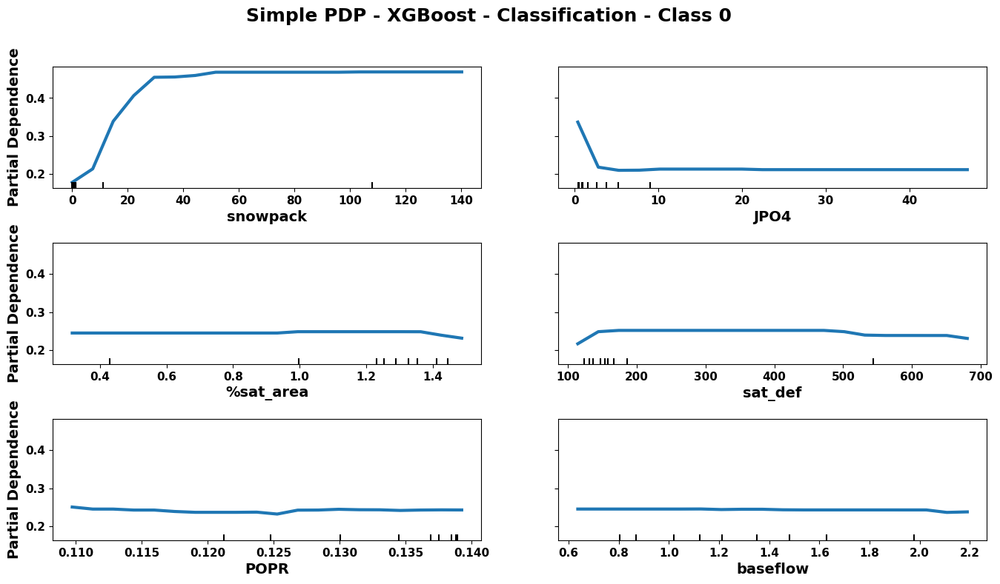

Simple PDP time: 1.04 seconds


[20:53:12] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "verbose" } are not used.



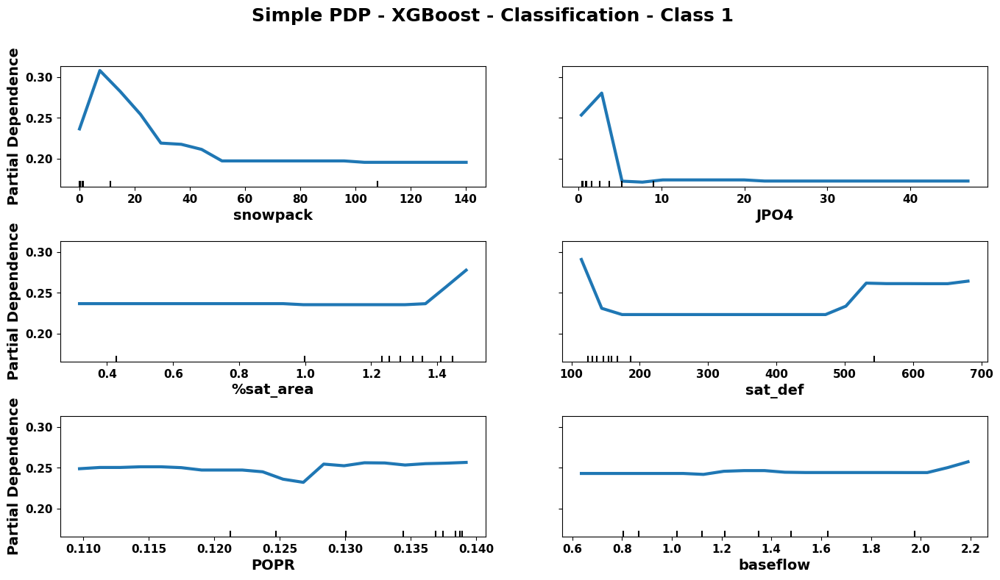

Simple PDP time: 0.87 seconds


[20:53:13] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "verbose" } are not used.



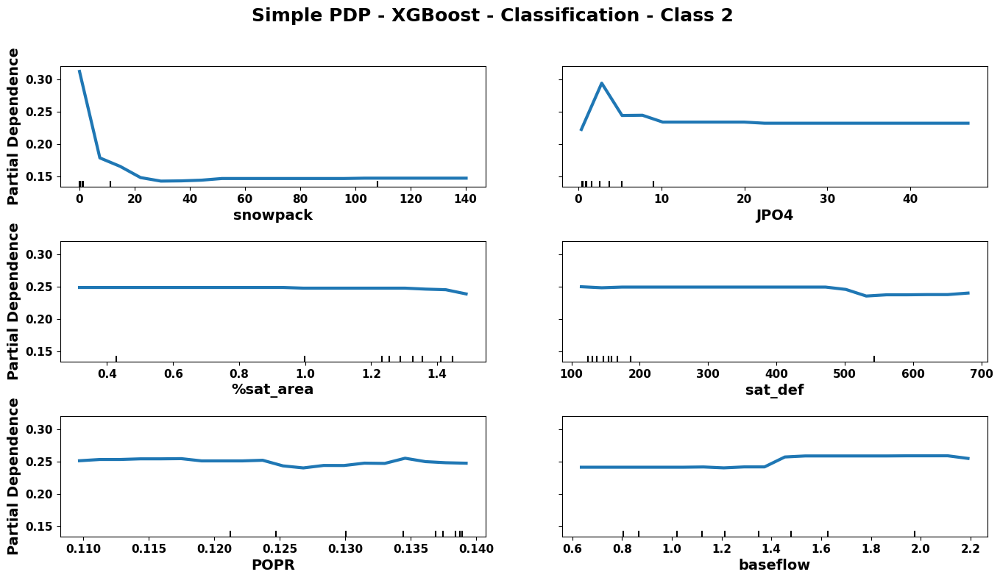

Simple PDP time: 1.01 seconds


[20:53:14] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "verbose" } are not used.



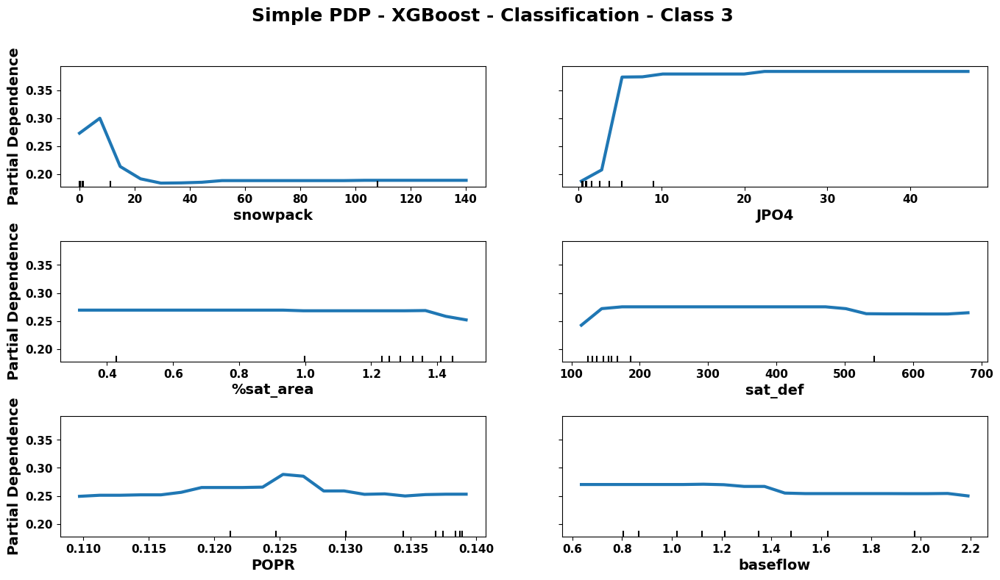

Simple PDP time: 0.96 seconds

Total XGBoost classification simple PDP time: 3.89 seconds


In [41]:

xgb_clf_top6 = get_top_features(xgb_clf_imp_df, score_col="mean", top_k=6)
print("XGBoost Classification Top 6:", xgb_clf_top6)

# simple PDPs
xgb_clf_simple_times = {}

xgb_clf_simple_start = time.time()

for class_id in range(4):
    xgb_clf_simple_times[class_id] = plot_simple_pdps(
        model=xgb_clf_loaded,
        X_train=X_class_train,
        features=xgb_clf_top6,
        title=f"Simple PDP - XGBoost - Classification - Class {class_id}",
        is_classification=True,
        class_id=class_id,
        subsample_n=50,
        grid_resolution=20,
        n_jobs=4
        )

xgb_clf_simple_total_time = time.time() - xgb_clf_simple_start
print(f"\nTotal XGBoost classification simple PDP time: {xgb_clf_simple_total_time:.2f} seconds")


/home/adil/miniconda3/envs/genv/lib/python3.10/site-packages/xgboost/core.py:2676: UserWarning: [20:53:15] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "verbose" } are not used.

  if len(data.shape) != 1 and self.num_features() != data.shape[1]:


snowpack: bootstrap PDP finished in 0.70 seconds
JPO4: bootstrap PDP finished in 0.72 seconds
%sat_area: bootstrap PDP finished in 0.79 seconds
sat_def: bootstrap PDP finished in 0.70 seconds
POPR: bootstrap PDP finished in 0.70 seconds
baseflow: bootstrap PDP finished in 0.70 seconds


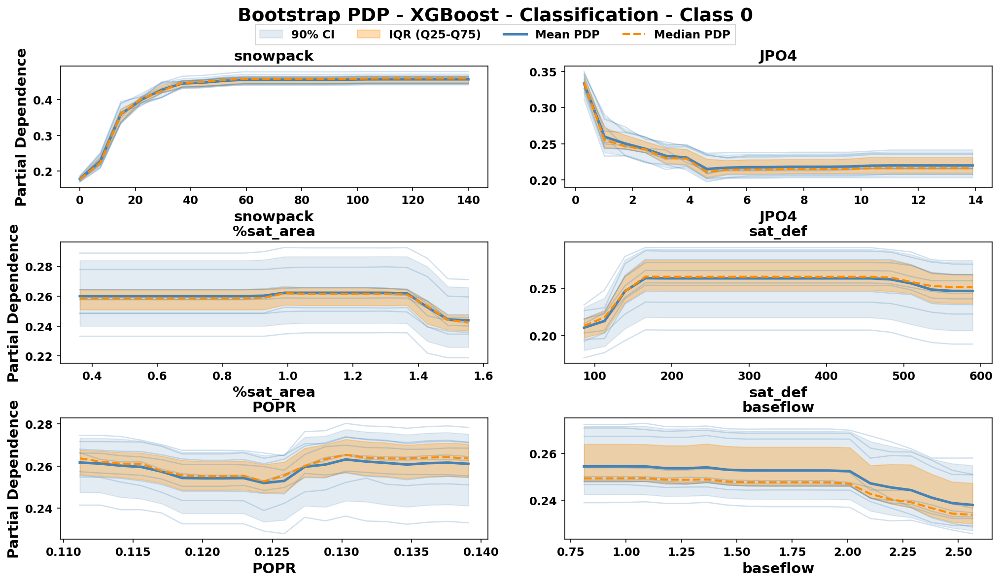

Bootstrap PDP total time: 4.99 seconds


/home/adil/miniconda3/envs/genv/lib/python3.10/site-packages/xgboost/core.py:2676: UserWarning: [20:53:20] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "verbose" } are not used.

  if len(data.shape) != 1 and self.num_features() != data.shape[1]:


snowpack: bootstrap PDP finished in 0.81 seconds
JPO4: bootstrap PDP finished in 0.71 seconds
%sat_area: bootstrap PDP finished in 0.70 seconds
sat_def: bootstrap PDP finished in 0.79 seconds
POPR: bootstrap PDP finished in 0.70 seconds
baseflow: bootstrap PDP finished in 0.70 seconds


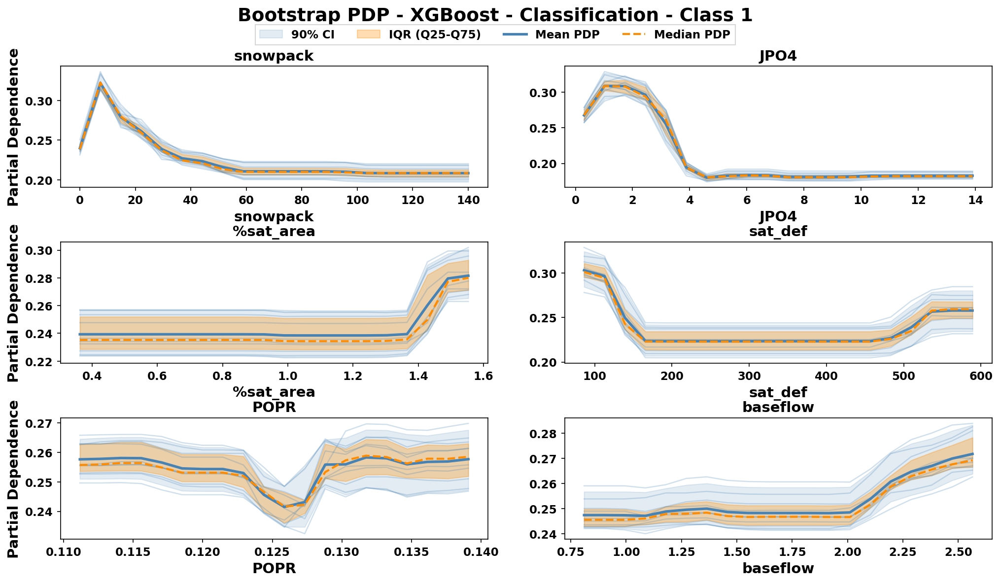

Bootstrap PDP total time: 5.08 seconds


/home/adil/miniconda3/envs/genv/lib/python3.10/site-packages/xgboost/core.py:2676: UserWarning: [20:53:25] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "verbose" } are not used.

  if len(data.shape) != 1 and self.num_features() != data.shape[1]:


snowpack: bootstrap PDP finished in 0.79 seconds
JPO4: bootstrap PDP finished in 0.70 seconds
%sat_area: bootstrap PDP finished in 0.70 seconds
sat_def: bootstrap PDP finished in 0.70 seconds
POPR: bootstrap PDP finished in 0.79 seconds
baseflow: bootstrap PDP finished in 0.71 seconds


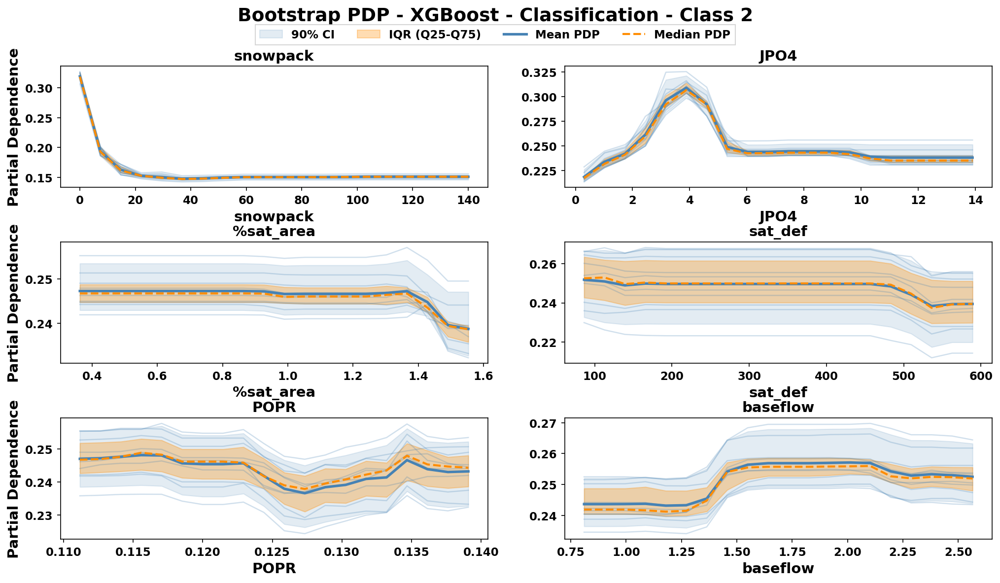

Bootstrap PDP total time: 5.08 seconds


/home/adil/miniconda3/envs/genv/lib/python3.10/site-packages/xgboost/core.py:2676: UserWarning: [20:53:30] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "verbose" } are not used.

  if len(data.shape) != 1 and self.num_features() != data.shape[1]:


snowpack: bootstrap PDP finished in 0.70 seconds
JPO4: bootstrap PDP finished in 0.69 seconds
%sat_area: bootstrap PDP finished in 0.70 seconds
sat_def: bootstrap PDP finished in 0.70 seconds
POPR: bootstrap PDP finished in 0.70 seconds
baseflow: bootstrap PDP finished in 0.79 seconds


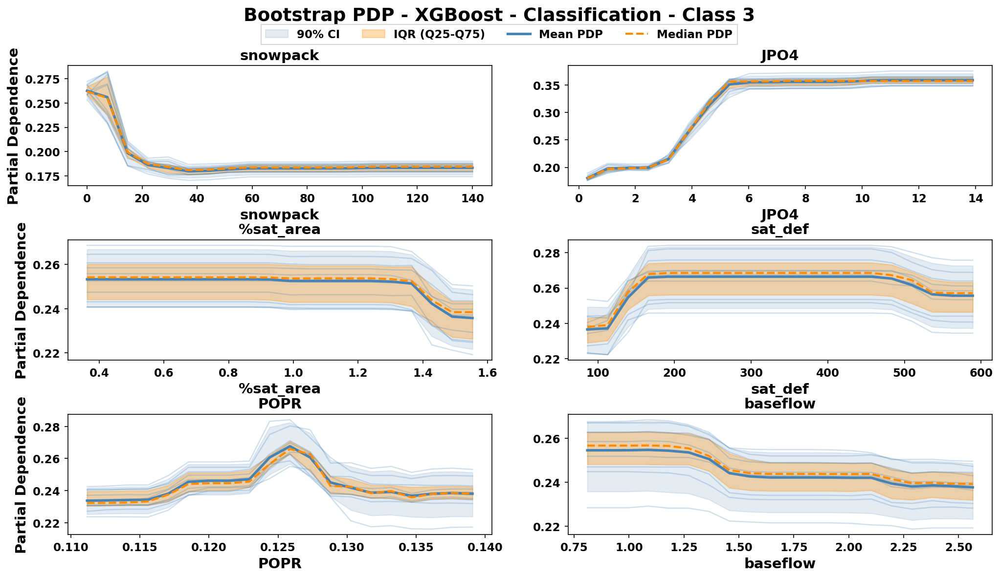

Bootstrap PDP total time: 5.07 seconds

Total XGBoost classification bootstrap PDP time: 20.21 seconds


In [42]:

# bootstrap PDPs
xgb_clf_bootstrap_times = {}

xgb_clf_bootstrap_start = time.time()

for class_id in range(4):
    xgb_clf_bootstrap_times[class_id] = plot_bootstrap_pdps(
        model=xgb_clf_loaded,
        X_train=X_class_train,
        features=xgb_clf_top6,
        title=f"Bootstrap PDP - XGBoost - Classification - Class {class_id}",
        is_classification=True,
        class_id=class_id,
        n_bootstrap=10,
        subsample_n=100,
        grid_resolution=20
        )

xgb_clf_bootstrap_total_time = time.time() - xgb_clf_bootstrap_start
print(f"\nTotal XGBoost classification bootstrap PDP time: {xgb_clf_bootstrap_total_time:.2f} seconds")


### **XGBoost Classification PDPs Interpretation**

- **JPO4 is again the separating feature:**
    - Higher JPO4 reduces Class 1 probability, while increasing Class 2 and Class 3 probabilities.
- **Snowpack shows a class dependent pattern:**
    - Supports Class 0 and Class 1, but generally reduces Class 2 probability.
- **JPON behaves differently across classes:**
    - Increases Class 2 probability, and shows weaker and non linear effects for Classes 0 and 3.
- **sat_def contributes through threshold effects,** especially for Classes 1 to 3, where probability changes sharply after low to moderate values.
- **evap shows weaker but structured effects,** with positive association for higher classes and weaker influence for Class 0.
- **POPR is mostly non-linear and secondary,** with relatively small changes compared with JPO4, snowpack, and JPON.
- **Bootstrap PDPs confirm the major trends from the simple PDPs, especially for JPO4, snowpack, JPON, and sat_def.**

`These PDPs show emulator-learned predictive associations, not direct causal effects.`

##### **7.6.2 XGBoost Regression PDPs**

XGBoost Regression Top 6: ['JPO4', 'sat_def', 'missisquoi_Q', 'baseflow', 'JPOP', '%sat_area']


[20:53:35] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "verbose" } are not used.



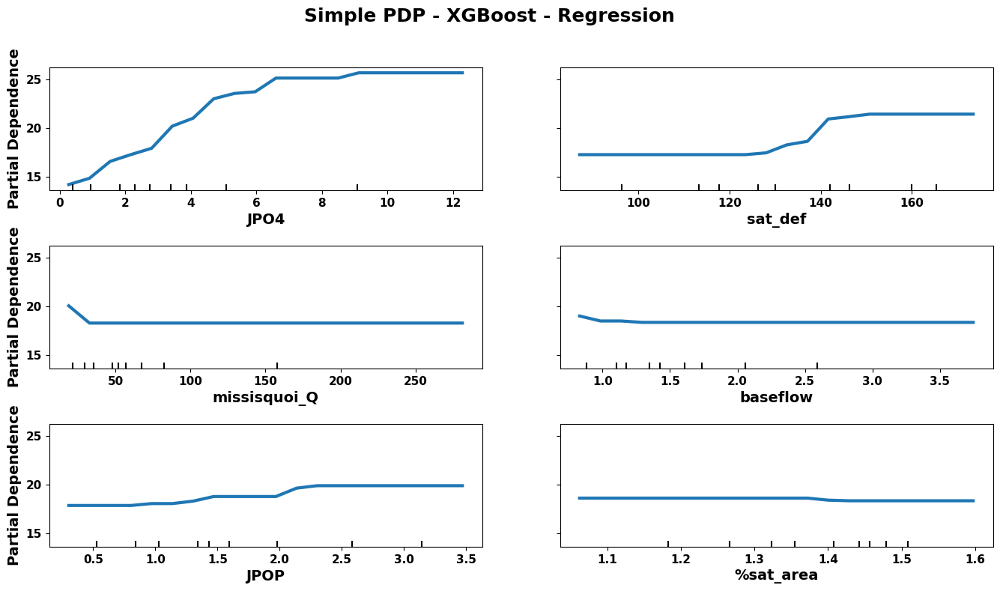

Simple PDP time: 0.86 seconds

Total XGBoost regression simple PDP time: 0.86 seconds


In [43]:

xgb_reg_top6 = get_top_features(xgb_reg_imp_df, score_col="mean", top_k=6)
print("XGBoost Regression Top 6:", xgb_reg_top6)

# simple PDP
xgb_reg_simple_start = time.time()

xgb_reg_simple_time = plot_simple_pdps(
    model=xgb_reg_loaded,
    X_train=X_reg_train,
    features=xgb_reg_top6,
    title="Simple PDP - XGBoost - Regression",
    is_classification=False,
    subsample_n=50,
    grid_resolution=20,
    n_jobs=4
    )

xgb_reg_simple_total_time = time.time() - xgb_reg_simple_start
print(f"\nTotal XGBoost regression simple PDP time: {xgb_reg_simple_total_time:.2f} seconds")



/home/adil/miniconda3/envs/genv/lib/python3.10/site-packages/xgboost/core.py:2676: UserWarning: [20:53:36] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "verbose" } are not used.

  if len(data.shape) != 1 and self.num_features() != data.shape[1]:


JPO4: bootstrap PDP finished in 0.77 seconds
sat_def: bootstrap PDP finished in 0.67 seconds
missisquoi_Q: bootstrap PDP finished in 0.67 seconds
baseflow: bootstrap PDP finished in 0.67 seconds
JPOP: bootstrap PDP finished in 0.76 seconds
%sat_area: bootstrap PDP finished in 0.67 seconds


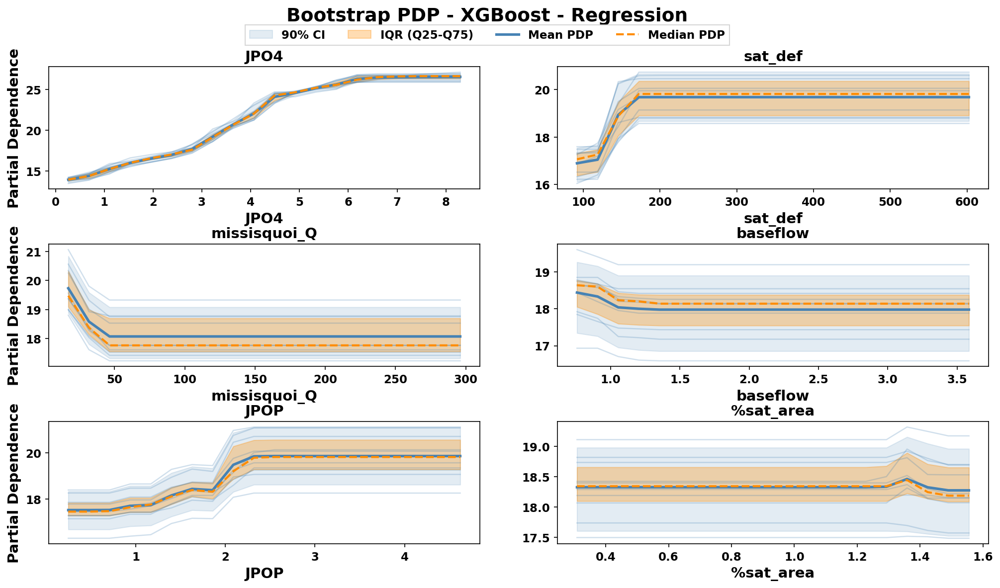

Bootstrap PDP total time: 4.81 seconds

Total XGBoost regression bootstrap PDP time: 4.81 seconds


In [44]:

# bootstrap PDP
xgb_reg_bootstrap_start = time.time()

xgb_reg_bootstrap_time = plot_bootstrap_pdps(
    model=xgb_reg_loaded,
    X_train=X_reg_train,
    features=xgb_reg_top6,
    title="Bootstrap PDP - XGBoost - Regression",
    is_classification=False,
    n_bootstrap=10,
    subsample_n=100,
    grid_resolution=20
    )

xgb_reg_bootstrap_total_time = time.time() - xgb_reg_bootstrap_start
print(f"\nTotal XGBoost regression bootstrap PDP time: {xgb_reg_bootstrap_total_time:.2f} seconds")


### **XGBoost Regression PDPs Interpretation**

- **JPO4 shows positive association:** predicted response increases steadily with JPO4 and then plateaus at higher values.
- **sat_def shows positive threshold effect,** with a sharp increase at low to moderate values followed by stabilization.
- **JPOP has a positive relationship,** where predictions increase after moderate values and then level off.
- **missisquoi_Q shows a negative early effect,** where predictions drop at low discharge values and remain mostly stable afterward.
- **baseflow has a weak negative effect,** suggesting limited influence compared with JPO4, sat_def, and JPOP.
- **%sat_area shows very weak and non linear relationship,** with only small changes across the range.
- **Bootstrap support the simple PDP trends, especially for JPO4, sat_def, JPOP, and missisquoi_Q.**

`These PDPs represent predictive associations learned by the emulator, not direct causal effects.`

In [45]:

pdp_time_summary = pd.DataFrame([
    ["RF", "Classification", rf_clf_simple_total_time, rf_clf_bootstrap_total_time],
    ["RF", "Regression", rf_reg_simple_total_time, rf_reg_bootstrap_total_time],
    ["LightGBM", "Classification", lgbm_clf_simple_total_time, lgbm_clf_bootstrap_total_time],
    ["LightGBM", "Regression", lgbm_reg_simple_total_time, lgbm_reg_bootstrap_total_time],
    ["XGBoost", "Classification", xgb_clf_simple_total_time, xgb_clf_bootstrap_total_time],
    ["XGBoost", "Regression", xgb_reg_simple_total_time, xgb_reg_bootstrap_total_time],
], columns=["Model", "Task", "Simple PDP Time (sec)", "Bootstrap PDP Time (sec)"])

pdp_time_summary


,Model,Task,Simple PDP Time (sec),Bootstrap PDP Time (sec)
0,RF,Classification,7.152301,40.476981
1,RF,Regression,0.544868,2.036710
2,LightGBM,Classification,2.656498,10.918645
3,LightGBM,Regression,0.679546,2.359746
4,XGBoost,Classification,3.893335,20.212968
5,XGBoost,Regression,0.860522,4.805459


### **8. Transferability of the Workflow**

The workflow used in this notebook is **not limited to chlorophyll-a or waterquality modeling**.
The same emulator-analysis pipeline can be **reused for many simulation based environmental problems**, such as:

- Flood simulator emulation,
- Drought-risk surrogate modeling,
- Crop yield scenario exploration,
- Lake and reservoir water-quality analysis,
- Climate impact scenario screening,
- Policy and management intervention analysis.

**The reusable workflow is:**
- Start with simulator-generated input-output data,
- Train a fast emulator,
- Validate emulator fidelity,
- Inspect feature importance,
- Analyze PDPs for response behavior,
- Use bootstrap summaries to check interpretation stability,
- Interpret results carefully within the limits of the simulator.

`The main idea is that emulators can make expensive simulation workflows more interactive, interpretable, and scalable.`

### **9. Key Takeaways**
#### **9.1 Key Takeaways**
- Emulators can approximate simulator behavior at much lower computational cost.
- Regression and classification provide complementary views of the system:
  - regression captures continuous response magnitude,
  - classification captures ecological regime behavior.
- Feature importance identifies variables that are predictive inside the trained emulator.
- PDPs show how model predictions change as one feature varies.
- Bootstrap PDPs help distinguish stable response patterns from uncertain ones.
- Emulator interpretation can support teleconnection discovery by highlighting distant or indirect drivers associated with local water-quality outcomes.
- Strong predictive importance does **not** automatically imply real-world causality.
#### **9.2 Final Cautions**
- The emulator is trained on simulated outputs.
- It inherits assumptions, simplifications, and biases from the original simulator.
- Feature importance can be affected by correlated predictors.
- PDPs rely on partial-independence assumptions and may evaluate unrealistic feature combinations.
- Bootstrap PDPs improve stability assessment, but they do not create causal certainty.
